In [1]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, Model, optimizers, losses, metrics, regularizers
import tensorflow_datasets as tfds
from tensorflow.keras.applications import MobileNetV3Large, MobileNetV3Small, EfficientNetB3
from tensorflow.keras.applications.mobilenet import preprocess_input as preprocess_input_mobile
from tensorflow.keras.applications.efficientnet import preprocess_input as preprocess_input_efficient
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
import cv2
import gc
import os
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import seaborn as sns
import time
import pickle
from tqdm import tqdm
%matplotlib inline

2025-06-16 11:55:39.538225: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1750074940.030252      35 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1750074940.157184      35 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


# Load GPUs

In [2]:
gpus = tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus:
    tf.config.experimental.set_memory_growth(gpu , True)
strategy = tf.distribute.MirroredStrategy()

I0000 00:00:1750074962.270436      35 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1750074962.271179      35 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


# Load Dataset

In [3]:
(train_dataset, validate_dataset, test_dataset) , info_dataset = tfds.load(
    'oxford_iiit_pet:4.0.0',
    split = ['train[:80%]', 'train[80%:]', 'test'], # Split to 80% train, 20% validate and test set
    shuffle_files = True, 
    as_supervised = False,
    with_info = True, # Get dataset info
)

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Generating splits...:   0%|          | 0/2 [00:00<?, ? splits/s]

Generating train examples...: 0 examples [00:00, ? examples/s]

Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


Shuffling /root/tensorflow_datasets/oxford_iiit_pet/incomplete.0OXI4C_4.0.0/oxford_iiit_pet-train.tfrecord*...…

Generating test examples...: 0 examples [00:00, ? examples/s]

Shuffling /root/tensorflow_datasets/oxford_iiit_pet/incomplete.0OXI4C_4.0.0/oxford_iiit_pet-test.tfrecord*...:…

Dataset oxford_iiit_pet downloaded and prepared to /root/tensorflow_datasets/oxford_iiit_pet/4.0.0. Subsequent calls will reuse this data.


In [4]:
IMG_SIZE = 224
AUTOTUNE = tf.data.AUTOTUNE
BATCH_SIZE = 32

# Data preprocessing for EfficientNetB3

In [5]:
def preprocessing_efficient(sample):

    image = tf.image.resize(sample['image'], (IMG_SIZE, IMG_SIZE))
    image = tf.cast(image, tf.float32)
    image = preprocess_input_efficient(image) # Special preprocessing for EfficientNet

    mask = sample['segmentation_mask']
    mask = tf.image.resize(mask, (IMG_SIZE, IMG_SIZE), method = 'nearest')
    mask = tf.where(mask == 1, 1.0, 0.0)
    mask = tf.cast(mask, tf.float32)

    label = tf.cast(sample['label'], tf.int32)
    bbox = tf.cast(sample['head_bbox'], tf.float32)

    return image, label, bbox, mask

# Data preprocessing for MobileNetV3 Small and Large

In [6]:
def preprocessing_mobile(sample):

    image = tf.image.resize(sample['image'], (IMG_SIZE, IMG_SIZE))
    image = tf.cast(image, tf.float32)
    image = preprocess_input_mobile(image) # Special preprocessing for MobileNet

    mask = sample['segmentation_mask']
    mask = tf.image.resize(mask, (IMG_SIZE, IMG_SIZE), method = 'nearest')
    mask = tf.where(mask == 1, 1.0, 0.0)
    mask = tf.cast(mask, tf.float32)

    label = tf.cast(sample['label'], tf.int32)
    bbox = tf.cast(sample['head_bbox'], tf.float32)

    return image, label, bbox, mask

# Final dataset for EfficientNet

In [7]:
train_dataset_final = (train_dataset
                      .map(preprocessing_efficient, num_parallel_calls = AUTOTUNE) # Map preprocessing method to dataset
                      .batch(BATCH_SIZE)
                      .prefetch(AUTOTUNE))

test_dataset_final = (test_dataset
                      .map(preprocessing_efficient, num_parallel_calls = AUTOTUNE) 
                      .batch(BATCH_SIZE)
                      .prefetch(AUTOTUNE))

validate_dataset_final = (validate_dataset
                      .map(preprocessing_efficient, num_parallel_calls = AUTOTUNE)
                      .batch(BATCH_SIZE)
                      .prefetch(AUTOTUNE))

# Analyze Dataset

In [10]:
num_classes = info_dataset.features['label'].num_classes
class_names = info_dataset.features['label'].names

print(f"Number of classes: {len(class_names)}")
print("Class names:")
for i, name in enumerate(class_names):
    print(f"{i}: {name}")


print(f"Number of classes: {len(class_names)}")
print("Class names:")
for i, name in enumerate(class_names):
    print(f"{i}: {name}")

Number of classes: 37
Class names:
0: Abyssinian
1: american_bulldog
2: american_pit_bull_terrier
3: basset_hound
4: beagle
5: Bengal
6: Birman
7: Bombay
8: boxer
9: British_Shorthair
10: chihuahua
11: Egyptian_Mau
12: english_cocker_spaniel
13: english_setter
14: german_shorthaired
15: great_pyrenees
16: havanese
17: japanese_chin
18: keeshond
19: leonberger
20: Maine_Coon
21: miniature_pinscher
22: newfoundland
23: Persian
24: pomeranian
25: pug
26: Ragdoll
27: Russian_Blue
28: saint_bernard
29: samoyed
30: scottish_terrier
31: shiba_inu
32: Siamese
33: Sphynx
34: staffordshire_bull_terrier
35: wheaten_terrier
36: yorkshire_terrier
Number of classes: 37
Class names:
0: Abyssinian
1: american_bulldog
2: american_pit_bull_terrier
3: basset_hound
4: beagle
5: Bengal
6: Birman
7: Bombay
8: boxer
9: British_Shorthair
10: chihuahua
11: Egyptian_Mau
12: english_cocker_spaniel
13: english_setter
14: german_shorthaired
15: great_pyrenees
16: havanese
17: japanese_chin
18: keeshond
19: leonber

# Visualize quantity of each class

In [9]:
def countEachClass(data):
    freqs = {}
    for _, label, _, _ in data.unbatch():
        label_val = label.numpy()
        freqs[label_val] = freqs.get(label_val, 0) + 1

    df = pd.DataFrame({
        'class_name' : [class_names[i] for i in sorted(freqs)],
        'count' : [freqs[i] for i in sorted(freqs)]
    }).set_index('class_name')

    return df

In [10]:
train_df = countEachClass(train_dataset_final)
test_df = countEachClass(test_dataset_final)
validate_df = countEachClass(validate_dataset_final)

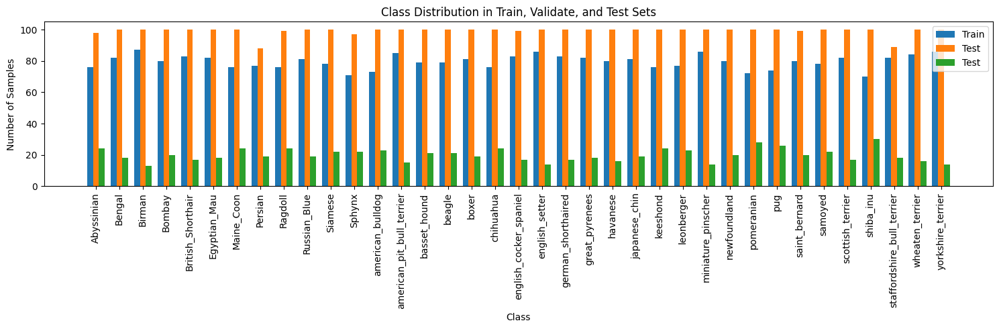

In [11]:
all_classes = sorted(set(train_df.index) | set(validate_df.index) | set(test_df.index))

x = np.arange(len(all_classes))
width = 0.25

plt.figure(figsize = (15, 5))
plt.bar(x - width, train_df['count'].tolist(), width = width, label = 'Train')
plt.bar(x, test_df['count'].tolist(), width = width, label = 'Test')
plt.bar(x + width, validate_df['count'].tolist(), width = width, label = 'Test')

plt.xticks(x, all_classes, rotation=90)
plt.legend()
plt.xlabel('Class')
plt.ylabel('Number of Samples')
plt.title('Class Distribution in Train, Validate, and Test Sets')
plt.tight_layout()
plt.show()

# Visualize example images with bounding box

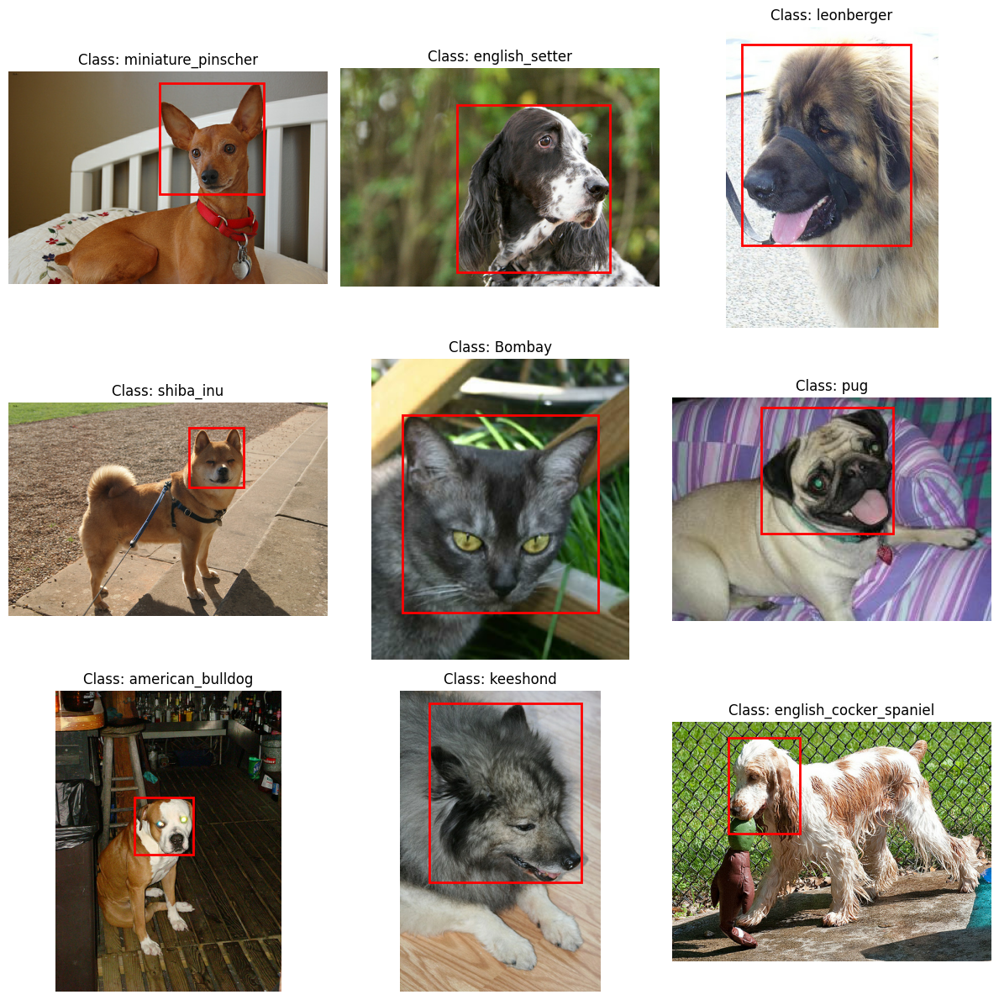

In [12]:
fig, axes = plt.subplots(3, 3, figsize=(12, 12))
axes = axes.flatten()

for i, img in enumerate(train_dataset.take(9)):
    image = img['image']
    label = img['label']
    bbox = img['head_bbox']

    img_np = image.numpy()
    h, w = img_np.shape[:2]

    ymin, xmin, ymax, xmax = bbox.numpy()
    xmin *= w
    xmax *= w
    ymin *= h
    ymax *= h
    box_width = xmax - xmin
    box_height = ymax - ymin

    ax = axes[i]
    ax.imshow(img_np)
    rect = patches.Rectangle((xmin, ymin), box_width, box_height,
                             linewidth=2, edgecolor='r', facecolor='none')
    ax.add_patch(rect)
    ax.set_title(f"Class: {class_names[label.numpy()]}")
    ax.axis('off')

for j in range(i + 1, 9):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

# Visualize example images with mask

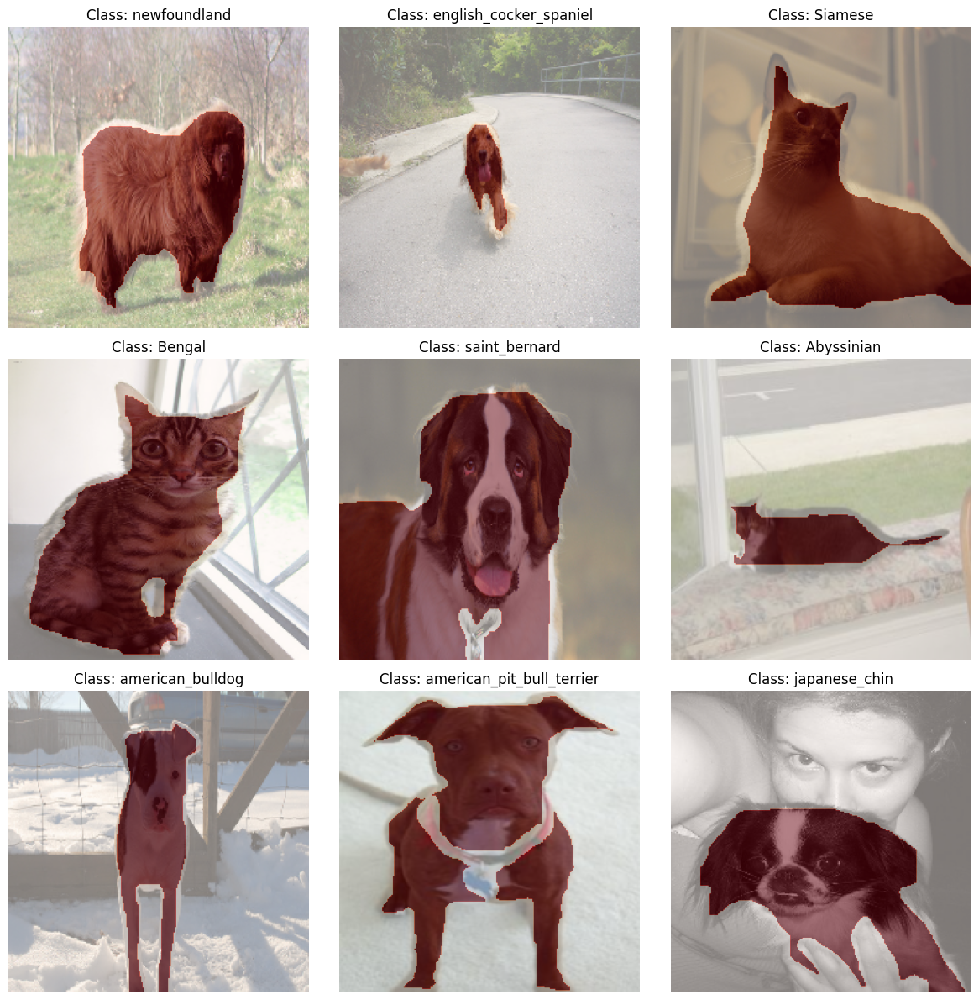

In [13]:
fig, axes = plt.subplots(3, 3, figsize=(12, 12))
axes = axes.flatten()

for i, (image, label, bbox, mask) in enumerate(train_dataset_final.take(1)):
    for j in range(9):
        img_np = image[j].numpy().astype("uint8")
        mask_np = mask[j].numpy()

        ax = axes[j]
        ax.imshow(img_np)
        ax.imshow(mask_np, cmap='Reds', alpha=0.5)
        ax.set_title(f"Class: {class_names[label[j].numpy()]}")
        ax.axis('off')

    break

plt.tight_layout()
plt.show()

# Detection Model

In [14]:
def DetectionHead_with_Backbone(pretrained = True, freeze_backbone = True, num_classes = num_classes):
    
    backbone = EfficientNetB3(
        include_top = False,
        input_shape=(IMG_SIZE, IMG_SIZE, 3),
        weights = 'imagenet' if pretrained else None,
    ) # EfficientNetB7 Backbone with imagenet weights
    
    backbone.trainable = not freeze_backbone # untrainable if freeze_backbone
    
    x = layers.GlobalAveragePooling2D()(backbone.output)

    x = layers.Dense(1028, activation='relu')(x)
    x = layers.BatchNormalization()(x)

    x = layers.Dense(1028, activation='relu')(x)
    x = layers.BatchNormalization()(x)

    label_branch = layers.Dense(256, activation = 'relu')(x)
    label_branch = layers.BatchNormalization()(label_branch)
    label_output = layers.Dense(num_classes, activation='softmax', name='label')(label_branch) # Final output for multi label classification

    bbox_branch = layers.Dense(256, activation = 'relu')(x)
    bbox_branch = layers.BatchNormalization()(bbox_branch)
    bbox_output = layers.Dense(4, activation='sigmoid', name='bbox')(bbox_branch) # Final output for  bounding box coordinate

    model = Model(inputs = backbone.input, outputs = {'label' : label_output, 'bbox' : bbox_output})
    
    return model

# Detection training loop

In [16]:
def trainDetectionModel(pretrained = True, freeze_backbone = True, num_classes = num_classes, epochs = 50):

    train_steps = tf.data.experimental.cardinality(train_dataset_final).numpy()
    val_steps = tf.data.experimental.cardinality(validate_dataset_final).numpy()

    model = DetectionHead_with_Backbone(pretrained = pretrained, freeze_backbone = freeze_backbone, num_classes = num_classes)
    
    optimizer_det = tf.keras.optimizers.Adam(learning_rate=1e-3)
    
    loss_cls = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True)
    loss_det = tf.keras.losses.MeanAbsoluteError()
    
    met_cls = tf.keras.metrics.SparseCategoricalAccuracy()
    met_det = tf.keras.metrics.MeanAbsoluteError()
    
    val_met_cls = tf.keras.metrics.SparseCategoricalAccuracy()
    val_met_det = tf.keras.metrics.MeanAbsoluteError()

    # Initialize manual ReduceLROnPlateau parameters
    best_val_loss = float('inf')
    lr_patience = 0
    lr_factor = 0.5
    lr_min = 1e-6
    lr_patience_limit = 2  # Number of epochs to wait before reducing LR
    
    # EarlyStopping config
    es_patience = 20
    es_wait = 0
    best_weights = model.get_weights()

    history = {
    'loss': [],
    'label_loss': [],
    'bbox_loss': [],
    'label_accuracy': [],
    'bbox_mae': [],
    'val_loss': [],
    'val_label_loss': [],
    'val_bbox_loss': [],
    'val_label_accuracy': [],
    'val_bbox_mae': [],
    'learning_rate': []
}
    
    for epoch in range(epochs):
        print(f"\nEpoch {epoch+1}/{epochs}")
        progbar = tqdm(total=train_steps, desc="Training", unit="batch")
    
        # Reset metrics at the start of each epoch
        met_cls.reset_state()
        met_det.reset_state()
        val_met_cls.reset_state()
        val_met_det.reset_state()
    
        total_loss = total_cls_loss = total_bbox_loss = 0
    
        # Training loop
        for x_batch, y_batch in train_dataset_final.map(lambda img, lbl, bbox, mask: (img, {'label': lbl, 'bbox': bbox})):
            with tf.GradientTape() as tape:
                preds = model(x_batch, training=True)
                cls_loss = loss_cls(y_batch['label'], preds['label'])
                bbox_loss = loss_det(y_batch['bbox'], preds['bbox'])
                loss = cls_loss + bbox_loss
    
            grads = tape.gradient(loss, model.trainable_variables)
            optimizer_det.apply_gradients(zip(grads, model.trainable_variables))
    
            # Update metrics
            met_cls.update_state(y_batch['label'], preds['label'])
            met_det.update_state(y_batch['bbox'], preds['bbox'])
    
            # Accumulate training losses
            total_loss += loss.numpy()
            total_cls_loss += cls_loss.numpy()
            total_bbox_loss += bbox_loss.numpy()
            progbar.update(1)
    
        progbar.close()
    
        # Validation loop
        val_total_loss = val_total_cls_loss = val_total_bbox_loss = 0
    
        for x_batch, y_batch in validate_dataset_final.map(lambda img, lbl, bbox, mask: (img, {'label': lbl, 'bbox': bbox})):
            val_preds = model(x_batch, training=False)
            val_cls_loss = loss_cls(y_batch['label'], val_preds['label'])
            val_bbox_loss = loss_det(y_batch['bbox'], val_preds['bbox'])
            val_loss = val_cls_loss + val_bbox_loss
    
            val_met_cls.update_state(y_batch['label'], val_preds['label'])
            val_met_det.update_state(y_batch['bbox'], val_preds['bbox'])
    
            val_total_loss += val_loss.numpy()
            val_total_cls_loss += val_cls_loss.numpy()
            val_total_bbox_loss += val_bbox_loss.numpy()
    
        # Calculate average losses over the number of steps
        avg_loss = total_loss / train_steps
        avg_cls_loss = total_cls_loss / train_steps
        avg_bbox_loss = total_bbox_loss / train_steps
    
        avg_val_loss = val_total_loss / val_steps
        avg_val_cls_loss = val_total_cls_loss / val_steps
        avg_val_bbox_loss = val_total_bbox_loss / val_steps
    
        # Retrieve the current learning rate
        current_lr = optimizer_det.learning_rate
        current_lr = current_lr.numpy() if isinstance(current_lr, tf.Variable) else float(current_lr)
    
        print(f"{train_steps}/{train_steps} - loss: {avg_loss:.4f} - label_loss: {avg_cls_loss:.4f} - bbox_loss: {avg_bbox_loss:.4f} "
              f"- label_accuracy: {met_cls.result().numpy():.4f} - bbox_mae: {met_det.result().numpy():.4f} "
              f"- val_loss: {avg_val_loss:.4f} - val_label_loss: {avg_val_cls_loss:.4f} - val_bbox_loss: {avg_val_bbox_loss:.4f} "
              f"- val_label_accuracy: {val_met_cls.result().numpy():.4f} - val_bbox_mae: {val_met_det.result().numpy():.4f} "
              f"- learning_rate: {current_lr:.6f}")

        history['loss'].append(avg_loss)
        history['label_loss'].append(avg_cls_loss)
        history['bbox_loss'].append(avg_bbox_loss)
        history['label_accuracy'].append(met_cls.result().numpy())
        history['bbox_mae'].append(met_det.result().numpy())
        history['val_loss'].append(avg_val_loss)
        history['val_label_loss'].append(avg_val_cls_loss)
        history['val_bbox_loss'].append(avg_val_bbox_loss)
        history['val_label_accuracy'].append(val_met_cls.result().numpy())
        history['val_bbox_mae'].append(val_met_det.result().numpy())
        history['learning_rate'].append(current_lr)

    
         # ReduceLROnPlateau logic
        if avg_val_loss < best_val_loss:
            best_val_loss = avg_val_loss
            best_weights = model.get_weights()  # Save weights here
            lr_patience = 0
            es_wait = 0  # Reset early stopping counter
        else:
            lr_patience += 1
            es_wait += 1
    
            # Reduce LR
            if lr_patience >= lr_patience_limit:
                old_lr = float(optimizer_det.learning_rate.numpy())
                new_lr = max(old_lr * lr_factor, lr_min)
                optimizer_det.learning_rate.assign(new_lr)
                print(f"Reducing learning rate from {old_lr:.6f} to {new_lr:.6f}")
                lr_patience = 0
    
            # Check EarlyStopping
            if es_wait >= es_patience:
                print(f"Early stopping triggered after {epoch + 1} epochs.")
                model.set_weights(best_weights)  # Restore the best weights
                break

    return model, history

In [17]:
det_pt, history_det_pt = trainDetectionModel(pretrained = True, freeze_backbone = True, num_classes = num_classes, epochs = 50)
det_pt.save('/kaggle/working/det_pt.keras')
with open('/kaggle/working/detection_history.pkl', 'wb') as f:
    pickle.dump(history_det_pt, f)

43941136/43941136 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step

Epoch 1/50


Training:   0%|          | 0/92 [00:00<?, ?batch/s]I0000 00:00:1750006216.781519      35 cuda_dnn.cc:529] Loaded cuDNN version 90300
/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/nn.py:708: UserWarning: "`sparse_categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
Training: 100%|██████████| 92/92 [01:59<00:00,  1.30s/batch]


92/92 - loss: 0.9009 - label_loss: 0.6680 - bbox_loss: 0.2329 - label_accuracy: 0.8084 - bbox_mae: 0.2329 - val_loss: 0.6734 - val_label_loss: 0.5307 - val_bbox_loss: 0.1427 - val_label_accuracy: 0.8954 - val_bbox_mae: 0.1427 - learning_rate: 0.001000

Epoch 2/50


Training: 100%|██████████| 92/92 [01:55<00:00,  1.25s/batch]


92/92 - loss: 0.2995 - label_loss: 0.1587 - bbox_loss: 0.1408 - label_accuracy: 0.9467 - bbox_mae: 0.1408 - val_loss: 0.4085 - val_label_loss: 0.2896 - val_bbox_loss: 0.1189 - val_label_accuracy: 0.9212 - val_bbox_mae: 0.1189 - learning_rate: 0.001000

Epoch 3/50


Training: 100%|██████████| 92/92 [01:54<00:00,  1.25s/batch]


92/92 - loss: 0.1984 - label_loss: 0.0885 - bbox_loss: 0.1099 - label_accuracy: 0.9698 - bbox_mae: 0.1099 - val_loss: 0.3914 - val_label_loss: 0.2780 - val_bbox_loss: 0.1135 - val_label_accuracy: 0.9076 - val_bbox_mae: 0.1135 - learning_rate: 0.001000

Epoch 4/50


Training: 100%|██████████| 92/92 [01:54<00:00,  1.25s/batch]


92/92 - loss: 0.1987 - label_loss: 0.0975 - bbox_loss: 0.1012 - label_accuracy: 0.9715 - bbox_mae: 0.1012 - val_loss: 0.4434 - val_label_loss: 0.3317 - val_bbox_loss: 0.1117 - val_label_accuracy: 0.9130 - val_bbox_mae: 0.1117 - learning_rate: 0.001000

Epoch 5/50


Training: 100%|██████████| 92/92 [01:54<00:00,  1.25s/batch]


92/92 - loss: 0.1696 - label_loss: 0.0713 - bbox_loss: 0.0983 - label_accuracy: 0.9783 - bbox_mae: 0.0983 - val_loss: 0.4947 - val_label_loss: 0.3861 - val_bbox_loss: 0.1085 - val_label_accuracy: 0.8995 - val_bbox_mae: 0.1085 - learning_rate: 0.001000
Reducing learning rate from 0.001000 to 0.000500

Epoch 6/50


Training: 100%|██████████| 92/92 [01:55<00:00,  1.25s/batch]


92/92 - loss: 0.1353 - label_loss: 0.0482 - bbox_loss: 0.0871 - label_accuracy: 0.9857 - bbox_mae: 0.0871 - val_loss: 0.3735 - val_label_loss: 0.2696 - val_bbox_loss: 0.1038 - val_label_accuracy: 0.9321 - val_bbox_mae: 0.1038 - learning_rate: 0.000500

Epoch 7/50


Training: 100%|██████████| 92/92 [01:55<00:00,  1.26s/batch]


92/92 - loss: 0.1013 - label_loss: 0.0184 - bbox_loss: 0.0829 - label_accuracy: 0.9939 - bbox_mae: 0.0829 - val_loss: 0.3819 - val_label_loss: 0.2804 - val_bbox_loss: 0.1015 - val_label_accuracy: 0.9198 - val_bbox_mae: 0.1015 - learning_rate: 0.000500

Epoch 8/50


Training: 100%|██████████| 92/92 [01:55<00:00,  1.25s/batch]


92/92 - loss: 0.0974 - label_loss: 0.0198 - bbox_loss: 0.0776 - label_accuracy: 0.9939 - bbox_mae: 0.0776 - val_loss: 0.3378 - val_label_loss: 0.2366 - val_bbox_loss: 0.1011 - val_label_accuracy: 0.9375 - val_bbox_mae: 0.1011 - learning_rate: 0.000500

Epoch 9/50


Training: 100%|██████████| 92/92 [01:55<00:00,  1.25s/batch]


92/92 - loss: 0.0804 - label_loss: 0.0075 - bbox_loss: 0.0728 - label_accuracy: 0.9986 - bbox_mae: 0.0728 - val_loss: 0.3433 - val_label_loss: 0.2422 - val_bbox_loss: 0.1011 - val_label_accuracy: 0.9416 - val_bbox_mae: 0.1011 - learning_rate: 0.000500

Epoch 10/50


Training: 100%|██████████| 92/92 [01:54<00:00,  1.25s/batch]


92/92 - loss: 0.0759 - label_loss: 0.0054 - bbox_loss: 0.0705 - label_accuracy: 0.9997 - bbox_mae: 0.0705 - val_loss: 0.3343 - val_label_loss: 0.2326 - val_bbox_loss: 0.1017 - val_label_accuracy: 0.9361 - val_bbox_mae: 0.1017 - learning_rate: 0.000500

Epoch 11/50


Training: 100%|██████████| 92/92 [01:54<00:00,  1.25s/batch]


92/92 - loss: 0.0790 - label_loss: 0.0106 - bbox_loss: 0.0683 - label_accuracy: 0.9966 - bbox_mae: 0.0683 - val_loss: 0.3676 - val_label_loss: 0.2661 - val_bbox_loss: 0.1015 - val_label_accuracy: 0.9334 - val_bbox_mae: 0.1015 - learning_rate: 0.000500

Epoch 12/50


Training: 100%|██████████| 92/92 [01:54<00:00,  1.25s/batch]


92/92 - loss: 0.0786 - label_loss: 0.0107 - bbox_loss: 0.0679 - label_accuracy: 0.9973 - bbox_mae: 0.0679 - val_loss: 0.3694 - val_label_loss: 0.2681 - val_bbox_loss: 0.1013 - val_label_accuracy: 0.9348 - val_bbox_mae: 0.1013 - learning_rate: 0.000500
Reducing learning rate from 0.000500 to 0.000250

Epoch 13/50


Training: 100%|██████████| 92/92 [01:55<00:00,  1.25s/batch]


92/92 - loss: 0.0669 - label_loss: 0.0051 - bbox_loss: 0.0618 - label_accuracy: 0.9990 - bbox_mae: 0.0618 - val_loss: 0.3551 - val_label_loss: 0.2544 - val_bbox_loss: 0.1006 - val_label_accuracy: 0.9321 - val_bbox_mae: 0.1006 - learning_rate: 0.000250

Epoch 14/50


Training: 100%|██████████| 92/92 [01:54<00:00,  1.25s/batch]


92/92 - loss: 0.0637 - label_loss: 0.0039 - bbox_loss: 0.0598 - label_accuracy: 0.9990 - bbox_mae: 0.0598 - val_loss: 0.3336 - val_label_loss: 0.2351 - val_bbox_loss: 0.0985 - val_label_accuracy: 0.9389 - val_bbox_mae: 0.0985 - learning_rate: 0.000250

Epoch 15/50


Training: 100%|██████████| 92/92 [01:54<00:00,  1.25s/batch]


92/92 - loss: 0.0619 - label_loss: 0.0034 - bbox_loss: 0.0586 - label_accuracy: 0.9993 - bbox_mae: 0.0586 - val_loss: 0.3447 - val_label_loss: 0.2453 - val_bbox_loss: 0.0994 - val_label_accuracy: 0.9402 - val_bbox_mae: 0.0994 - learning_rate: 0.000250

Epoch 16/50


Training: 100%|██████████| 92/92 [01:54<00:00,  1.24s/batch]


92/92 - loss: 0.0575 - label_loss: 0.0021 - bbox_loss: 0.0553 - label_accuracy: 1.0000 - bbox_mae: 0.0553 - val_loss: 0.3467 - val_label_loss: 0.2481 - val_bbox_loss: 0.0986 - val_label_accuracy: 0.9375 - val_bbox_mae: 0.0986 - learning_rate: 0.000250
Reducing learning rate from 0.000250 to 0.000125

Epoch 17/50


Training: 100%|██████████| 92/92 [01:54<00:00,  1.24s/batch]


92/92 - loss: 0.0546 - label_loss: 0.0023 - bbox_loss: 0.0522 - label_accuracy: 0.9997 - bbox_mae: 0.0522 - val_loss: 0.3380 - val_label_loss: 0.2414 - val_bbox_loss: 0.0966 - val_label_accuracy: 0.9416 - val_bbox_mae: 0.0966 - learning_rate: 0.000125

Epoch 18/50


Training: 100%|██████████| 92/92 [01:54<00:00,  1.24s/batch]


92/92 - loss: 0.0595 - label_loss: 0.0055 - bbox_loss: 0.0540 - label_accuracy: 0.9990 - bbox_mae: 0.0540 - val_loss: 0.3549 - val_label_loss: 0.2596 - val_bbox_loss: 0.0953 - val_label_accuracy: 0.9348 - val_bbox_mae: 0.0953 - learning_rate: 0.000125
Reducing learning rate from 0.000125 to 0.000063

Epoch 19/50


Training: 100%|██████████| 92/92 [01:54<00:00,  1.24s/batch]


92/92 - loss: 0.0525 - label_loss: 0.0020 - bbox_loss: 0.0505 - label_accuracy: 1.0000 - bbox_mae: 0.0505 - val_loss: 0.3460 - val_label_loss: 0.2504 - val_bbox_loss: 0.0956 - val_label_accuracy: 0.9348 - val_bbox_mae: 0.0956 - learning_rate: 0.000063

Epoch 20/50


Training: 100%|██████████| 92/92 [01:54<00:00,  1.24s/batch]


92/92 - loss: 0.0514 - label_loss: 0.0015 - bbox_loss: 0.0499 - label_accuracy: 1.0000 - bbox_mae: 0.0499 - val_loss: 0.3392 - val_label_loss: 0.2442 - val_bbox_loss: 0.0949 - val_label_accuracy: 0.9389 - val_bbox_mae: 0.0949 - learning_rate: 0.000063
Reducing learning rate from 0.000063 to 0.000031

Epoch 21/50


Training: 100%|██████████| 92/92 [01:54<00:00,  1.24s/batch]


92/92 - loss: 0.0506 - label_loss: 0.0018 - bbox_loss: 0.0489 - label_accuracy: 1.0000 - bbox_mae: 0.0489 - val_loss: 0.3377 - val_label_loss: 0.2431 - val_bbox_loss: 0.0946 - val_label_accuracy: 0.9389 - val_bbox_mae: 0.0946 - learning_rate: 0.000031

Epoch 22/50


Training: 100%|██████████| 92/92 [01:53<00:00,  1.24s/batch]


92/92 - loss: 0.0512 - label_loss: 0.0028 - bbox_loss: 0.0484 - label_accuracy: 0.9993 - bbox_mae: 0.0484 - val_loss: 0.3392 - val_label_loss: 0.2446 - val_bbox_loss: 0.0946 - val_label_accuracy: 0.9375 - val_bbox_mae: 0.0946 - learning_rate: 0.000031
Reducing learning rate from 0.000031 to 0.000016

Epoch 23/50


Training: 100%|██████████| 92/92 [01:53<00:00,  1.24s/batch]


92/92 - loss: 0.0469 - label_loss: 0.0013 - bbox_loss: 0.0456 - label_accuracy: 1.0000 - bbox_mae: 0.0456 - val_loss: 0.3374 - val_label_loss: 0.2433 - val_bbox_loss: 0.0942 - val_label_accuracy: 0.9375 - val_bbox_mae: 0.0942 - learning_rate: 0.000016

Epoch 24/50


Training: 100%|██████████| 92/92 [01:54<00:00,  1.24s/batch]


92/92 - loss: 0.0453 - label_loss: 0.0012 - bbox_loss: 0.0441 - label_accuracy: 1.0000 - bbox_mae: 0.0441 - val_loss: 0.3350 - val_label_loss: 0.2410 - val_bbox_loss: 0.0940 - val_label_accuracy: 0.9402 - val_bbox_mae: 0.0940 - learning_rate: 0.000016
Reducing learning rate from 0.000016 to 0.000008

Epoch 25/50


Training: 100%|██████████| 92/92 [01:53<00:00,  1.24s/batch]


92/92 - loss: 0.0475 - label_loss: 0.0014 - bbox_loss: 0.0461 - label_accuracy: 1.0000 - bbox_mae: 0.0461 - val_loss: 0.3346 - val_label_loss: 0.2407 - val_bbox_loss: 0.0940 - val_label_accuracy: 0.9389 - val_bbox_mae: 0.0940 - learning_rate: 0.000008

Epoch 26/50


Training: 100%|██████████| 92/92 [01:53<00:00,  1.24s/batch]


92/92 - loss: 0.0495 - label_loss: 0.0035 - bbox_loss: 0.0460 - label_accuracy: 0.9993 - bbox_mae: 0.0460 - val_loss: 0.3348 - val_label_loss: 0.2410 - val_bbox_loss: 0.0938 - val_label_accuracy: 0.9402 - val_bbox_mae: 0.0938 - learning_rate: 0.000008
Reducing learning rate from 0.000008 to 0.000004

Epoch 27/50


Training: 100%|██████████| 92/92 [01:53<00:00,  1.24s/batch]


92/92 - loss: 0.0480 - label_loss: 0.0019 - bbox_loss: 0.0461 - label_accuracy: 0.9997 - bbox_mae: 0.0461 - val_loss: 0.3345 - val_label_loss: 0.2406 - val_bbox_loss: 0.0939 - val_label_accuracy: 0.9402 - val_bbox_mae: 0.0939 - learning_rate: 0.000004

Epoch 28/50


Training: 100%|██████████| 92/92 [01:53<00:00,  1.23s/batch]


92/92 - loss: 0.0485 - label_loss: 0.0030 - bbox_loss: 0.0456 - label_accuracy: 0.9997 - bbox_mae: 0.0456 - val_loss: 0.3337 - val_label_loss: 0.2399 - val_bbox_loss: 0.0938 - val_label_accuracy: 0.9402 - val_bbox_mae: 0.0938 - learning_rate: 0.000004
Reducing learning rate from 0.000004 to 0.000002

Epoch 29/50


Training: 100%|██████████| 92/92 [01:52<00:00,  1.23s/batch]


92/92 - loss: 0.0474 - label_loss: 0.0024 - bbox_loss: 0.0450 - label_accuracy: 0.9997 - bbox_mae: 0.0450 - val_loss: 0.3344 - val_label_loss: 0.2405 - val_bbox_loss: 0.0939 - val_label_accuracy: 0.9402 - val_bbox_mae: 0.0939 - learning_rate: 0.000002

Epoch 30/50


Training: 100%|██████████| 92/92 [01:52<00:00,  1.23s/batch]


92/92 - loss: 0.0464 - label_loss: 0.0015 - bbox_loss: 0.0449 - label_accuracy: 1.0000 - bbox_mae: 0.0449 - val_loss: 0.3336 - val_label_loss: 0.2398 - val_bbox_loss: 0.0938 - val_label_accuracy: 0.9402 - val_bbox_mae: 0.0938 - learning_rate: 0.000002
Reducing learning rate from 0.000002 to 0.000001

Epoch 31/50


Training: 100%|██████████| 92/92 [01:52<00:00,  1.22s/batch]


92/92 - loss: 0.0475 - label_loss: 0.0017 - bbox_loss: 0.0458 - label_accuracy: 1.0000 - bbox_mae: 0.0458 - val_loss: 0.3344 - val_label_loss: 0.2405 - val_bbox_loss: 0.0939 - val_label_accuracy: 0.9389 - val_bbox_mae: 0.0939 - learning_rate: 0.000001

Epoch 32/50


Training: 100%|██████████| 92/92 [01:53<00:00,  1.23s/batch]


92/92 - loss: 0.0462 - label_loss: 0.0013 - bbox_loss: 0.0449 - label_accuracy: 1.0000 - bbox_mae: 0.0449 - val_loss: 0.3343 - val_label_loss: 0.2404 - val_bbox_loss: 0.0938 - val_label_accuracy: 0.9402 - val_bbox_mae: 0.0938 - learning_rate: 0.000001
Reducing learning rate from 0.000001 to 0.000001

Epoch 33/50


Training: 100%|██████████| 92/92 [01:53<00:00,  1.23s/batch]


92/92 - loss: 0.0481 - label_loss: 0.0018 - bbox_loss: 0.0463 - label_accuracy: 1.0000 - bbox_mae: 0.0463 - val_loss: 0.3347 - val_label_loss: 0.2408 - val_bbox_loss: 0.0939 - val_label_accuracy: 0.9402 - val_bbox_mae: 0.0939 - learning_rate: 0.000001

Epoch 34/50


Training: 100%|██████████| 92/92 [01:53<00:00,  1.23s/batch]


92/92 - loss: 0.0473 - label_loss: 0.0040 - bbox_loss: 0.0433 - label_accuracy: 0.9990 - bbox_mae: 0.0433 - val_loss: 0.3337 - val_label_loss: 0.2399 - val_bbox_loss: 0.0938 - val_label_accuracy: 0.9389 - val_bbox_mae: 0.0938 - learning_rate: 0.000001
Reducing learning rate from 0.000001 to 0.000001
Early stopping triggered after 34 epochs.


In [ ]:
det_scratch, history_det_scratch = trainDetectionModel(pretrained = False, freeze_backbone = False, num_classes = num_classes, epochs = 50)
det_scratch.save('/kaggle/working/det_scratch.keras')
with open('/kaggle/working/det_scratch.pkl', 'wb') as f:
    pickle.dump(history_det_scratch, f)


Epoch 1/50


Training: 100%|██████████| 92/92 [04:43<00:00,  3.08s/batch]


92/92 - loss: 4.0084 - label_loss: 3.8401 - bbox_loss: 0.1683 - label_accuracy: 0.0343 - bbox_mae: 0.1683 - val_loss: 4.2369 - val_label_loss: 4.1041 - val_bbox_loss: 0.1327 - val_label_accuracy: 0.0299 - val_bbox_mae: 0.1327 - learning_rate: 0.001000

Epoch 2/50


Training: 100%|██████████| 92/92 [04:41<00:00,  3.06s/batch]


92/92 - loss: 3.8080 - label_loss: 3.6686 - bbox_loss: 0.1395 - label_accuracy: 0.0353 - bbox_mae: 0.1395 - val_loss: 4.4762 - val_label_loss: 4.3494 - val_bbox_loss: 0.1268 - val_label_accuracy: 0.0326 - val_bbox_mae: 0.1268 - learning_rate: 0.001000

Epoch 3/50


Training: 100%|██████████| 92/92 [04:42<00:00,  3.07s/batch]


92/92 - loss: 3.7572 - label_loss: 3.6198 - bbox_loss: 0.1374 - label_accuracy: 0.0404 - bbox_mae: 0.1374 - val_loss: 4.6063 - val_label_loss: 4.4319 - val_bbox_loss: 0.1744 - val_label_accuracy: 0.0190 - val_bbox_mae: 0.1744 - learning_rate: 0.001000
Reducing learning rate from 0.001000 to 0.000500

Epoch 4/50


Training: 100%|██████████| 92/92 [04:42<00:00,  3.07s/batch]


92/92 - loss: 3.6902 - label_loss: 3.5549 - bbox_loss: 0.1353 - label_accuracy: 0.0465 - bbox_mae: 0.1353 - val_loss: 4.4188 - val_label_loss: 4.2925 - val_bbox_loss: 0.1264 - val_label_accuracy: 0.0326 - val_bbox_mae: 0.1264 - learning_rate: 0.000500

Epoch 5/50


Training: 100%|██████████| 92/92 [04:42<00:00,  3.07s/batch]


92/92 - loss: 3.6743 - label_loss: 3.5394 - bbox_loss: 0.1350 - label_accuracy: 0.0489 - bbox_mae: 0.1350 - val_loss: 4.0820 - val_label_loss: 3.9619 - val_bbox_loss: 0.1201 - val_label_accuracy: 0.0326 - val_bbox_mae: 0.1201 - learning_rate: 0.000500

Epoch 6/50


Training: 100%|██████████| 92/92 [04:42<00:00,  3.07s/batch]


92/92 - loss: 3.6553 - label_loss: 3.5208 - bbox_loss: 0.1345 - label_accuracy: 0.0520 - bbox_mae: 0.1345 - val_loss: 3.7153 - val_label_loss: 3.5941 - val_bbox_loss: 0.1212 - val_label_accuracy: 0.0503 - val_bbox_mae: 0.1212 - learning_rate: 0.000500

Epoch 7/50


Training: 100%|██████████| 92/92 [04:41<00:00,  3.06s/batch]


92/92 - loss: 3.6312 - label_loss: 3.4966 - bbox_loss: 0.1346 - label_accuracy: 0.0601 - bbox_mae: 0.1346 - val_loss: 3.6974 - val_label_loss: 3.5743 - val_bbox_loss: 0.1231 - val_label_accuracy: 0.0666 - val_bbox_mae: 0.1231 - learning_rate: 0.000500

Epoch 8/50


Training: 100%|██████████| 92/92 [04:41<00:00,  3.06s/batch]


92/92 - loss: 3.5858 - label_loss: 3.4522 - bbox_loss: 0.1337 - label_accuracy: 0.0679 - bbox_mae: 0.1337 - val_loss: 3.7485 - val_label_loss: 3.6206 - val_bbox_loss: 0.1279 - val_label_accuracy: 0.0530 - val_bbox_mae: 0.1279 - learning_rate: 0.000500

Epoch 9/50


Training: 100%|██████████| 92/92 [04:42<00:00,  3.07s/batch]


92/92 - loss: 3.5461 - label_loss: 3.4130 - bbox_loss: 0.1332 - label_accuracy: 0.0652 - bbox_mae: 0.1332 - val_loss: 3.7212 - val_label_loss: 3.5941 - val_bbox_loss: 0.1271 - val_label_accuracy: 0.0530 - val_bbox_mae: 0.1271 - learning_rate: 0.000500
Reducing learning rate from 0.000500 to 0.000250

Epoch 10/50


Training: 100%|██████████| 92/92 [04:41<00:00,  3.06s/batch]


92/92 - loss: 3.4148 - label_loss: 3.2862 - bbox_loss: 0.1286 - label_accuracy: 0.0921 - bbox_mae: 0.1286 - val_loss: 3.6049 - val_label_loss: 3.4830 - val_bbox_loss: 0.1218 - val_label_accuracy: 0.0707 - val_bbox_mae: 0.1218 - learning_rate: 0.000250

Epoch 11/50


Training: 100%|██████████| 92/92 [04:41<00:00,  3.06s/batch]


92/92 - loss: 3.2983 - label_loss: 3.1750 - bbox_loss: 0.1234 - label_accuracy: 0.1087 - bbox_mae: 0.1234 - val_loss: 3.6850 - val_label_loss: 3.5624 - val_bbox_loss: 0.1227 - val_label_accuracy: 0.0679 - val_bbox_mae: 0.1227 - learning_rate: 0.000250

Epoch 12/50


Training: 100%|██████████| 92/92 [04:40<00:00,  3.05s/batch]


92/92 - loss: 3.2603 - label_loss: 3.1374 - bbox_loss: 0.1229 - label_accuracy: 0.1090 - bbox_mae: 0.1229 - val_loss: 3.6378 - val_label_loss: 3.5169 - val_bbox_loss: 0.1209 - val_label_accuracy: 0.0571 - val_bbox_mae: 0.1209 - learning_rate: 0.000250
Reducing learning rate from 0.000250 to 0.000125

Epoch 13/50


Training: 100%|██████████| 92/92 [04:43<00:00,  3.08s/batch]


92/92 - loss: 3.1108 - label_loss: 2.9894 - bbox_loss: 0.1213 - label_accuracy: 0.1386 - bbox_mae: 0.1213 - val_loss: 3.8133 - val_label_loss: 3.6872 - val_bbox_loss: 0.1261 - val_label_accuracy: 0.0815 - val_bbox_mae: 0.1261 - learning_rate: 0.000125

Epoch 14/50


Training: 100%|██████████| 92/92 [04:42<00:00,  3.07s/batch]


92/92 - loss: 2.9904 - label_loss: 2.8702 - bbox_loss: 0.1202 - label_accuracy: 0.1736 - bbox_mae: 0.1202 - val_loss: 3.6171 - val_label_loss: 3.4968 - val_bbox_loss: 0.1203 - val_label_accuracy: 0.0802 - val_bbox_mae: 0.1203 - learning_rate: 0.000125
Reducing learning rate from 0.000125 to 0.000063

Epoch 15/50


Training: 100%|██████████| 92/92 [04:42<00:00,  3.07s/batch]


92/92 - loss: 2.8753 - label_loss: 2.7554 - bbox_loss: 0.1199 - label_accuracy: 0.2052 - bbox_mae: 0.1199 - val_loss: 3.6074 - val_label_loss: 3.4881 - val_bbox_loss: 0.1193 - val_label_accuracy: 0.0856 - val_bbox_mae: 0.1193 - learning_rate: 0.000063

Epoch 16/50


Training:  45%|████▍     | 41/92 [02:06<02:36,  3.06s/batch]

# Visualize training metrics

In [26]:
def plotResults(history, model_name = 'Model'):
    metrics = ['bbox_loss', 'bbox_mae', 'label_accuracy', 'label_loss', 'loss']
    val_metrics = ['val_bbox_loss', 'val_bbox_mae', 'val_label_accuracy', 'val_label_loss', 'val_loss']

    epochs = range(1, len(history['loss']) + 1)

    fig, axes = plt.subplots(1, 5, figsize=(25, 5))

    for i, (metric, val_metric) in enumerate(zip(metrics, val_metrics)):
        ax = axes[i]
        ax.plot(epochs, history[metric], label=f'Train {metric}')
        ax.plot(epochs, history[val_metric], label=f'Val {metric}')
        ax.set_title(metric)
        ax.set_xlabel('Epochs')
        ax.set_ylabel(metric)
        ax.legend()

    plt.suptitle(model_name, fontsize = 16)
    plt.tight_layout()
    plt.show()

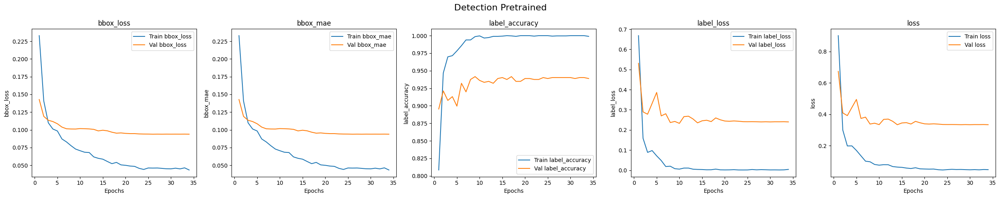

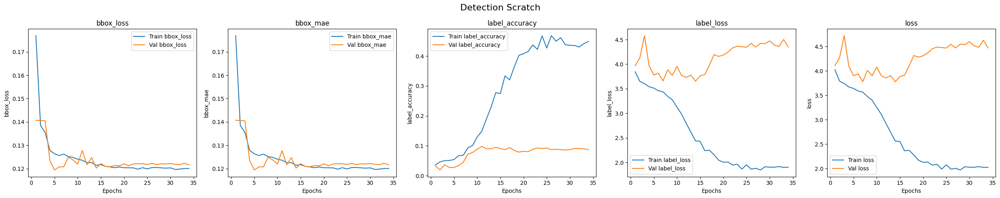

In [30]:
with open('/kaggle/input/detection/other/default/1/det/det_pt.pkl', 'rb') as f:
    history_det_pt = pickle.load(f)
plotResults(history_det_pt, model_name = 'Detection Pretrained')

with open('/kaggle/input/detection/other/default/1/det/det_scratch.pkl', 'rb') as f:
    history_det_scratch = pickle.load(f)
plotResults(history_det_scratch, model_name = 'Detection Scratch')

# Visualize Grouth Truth and Predicted bounding box and compute IoU

In [53]:
def intersectionOverUnion(X, Y):
    
    A, B, C, D = X
    A_, B_, C_, D_ = Y
    
    A_inter = max(A, A_)
    B_inter = max(B, B_)
    C_inter = min(C, C_)
    D_inter = min(D, D_)
    
    X_INTER_Y = max(0, (C_inter - A_inter) * (D_inter - B_inter))
    
    X = (C - A) * (D - B)
    Y = (C_ - A_) * (D_ - B_)
    
    X_UNION_Y = X + Y - X_INTER_Y
    
    return X_INTER_Y / X_UNION_Y

def Visualize_Detection(model, data, class_names, num_samples=4, model_name='Model'):

    for images, labels, bboxes, masks in data.take(1):

        predicted = model(images, training=False)
        predicted_bboxes = predicted['bbox'].numpy()
        predicted_labels = tf.argmax(predicted['label'], axis=1).numpy()

        plt.figure(figsize=(5 * num_samples, 5))
        for i in range(min(num_samples, images.shape[0])):
            img = images[i].numpy()

            img = img.astype(np.uint8) if img.max() > 1.0 else (img * 255).astype(np.uint8)

            ground_truth_bbox = bboxes[i].numpy()
            predicted_bbox = predicted_bboxes[i]
            ground_truth_label = labels[i].numpy()
            predicted_label = predicted_labels[i]

            IOU = intersectionOverUnion(ground_truth_bbox, predicted_bbox)

            h, w, _ = img.shape
            gt_box_abs = [
                int(ground_truth_bbox[0] * h),
                int(ground_truth_bbox[1] * w),
                int(ground_truth_bbox[2] * h),
                int(ground_truth_bbox[3] * w)
            ]
            pred_box_abs = [
                int(predicted_bbox[0] * h),
                int(predicted_bbox[1] * w),
                int(predicted_bbox[2] * h),
                int(predicted_bbox[3] * w)
            ]

            img = cv2.rectangle(img, (gt_box_abs[1], gt_box_abs[0]), (gt_box_abs[3], gt_box_abs[2]), (0, 255, 0), 2)
            img = cv2.rectangle(img, (pred_box_abs[1], pred_box_abs[0]), (pred_box_abs[3], pred_box_abs[2]), (0, 0, 255), 2)

            plt.subplot(1, num_samples, i + 1)
            plt.imshow(img)
            plt.title(f"GT: {class_names[ground_truth_label]}\nPred: {class_names[predicted_label]}\nIOU: {IOU:.2f}")
            plt.axis('off')

        plt.suptitle(model_name, fontsize=16)
        plt.tight_layout()
        plt.show()

In [39]:
det_pt = keras.models.load_model('/kaggle/input/detection/other/default/1/det/det_pt.keras')
det_scratch = keras.models.load_model('/kaggle/input/detection/other/default/1/det/det_scratch.keras')

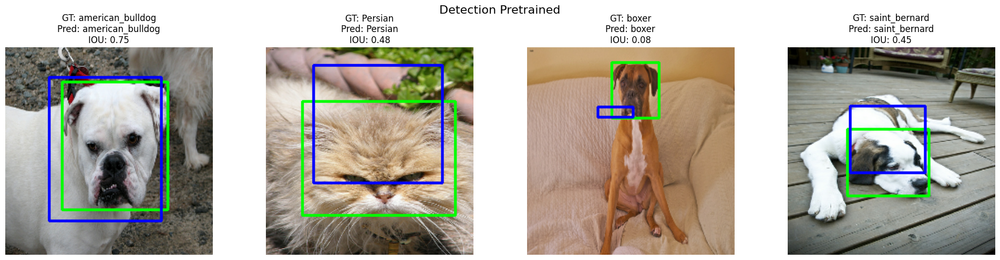

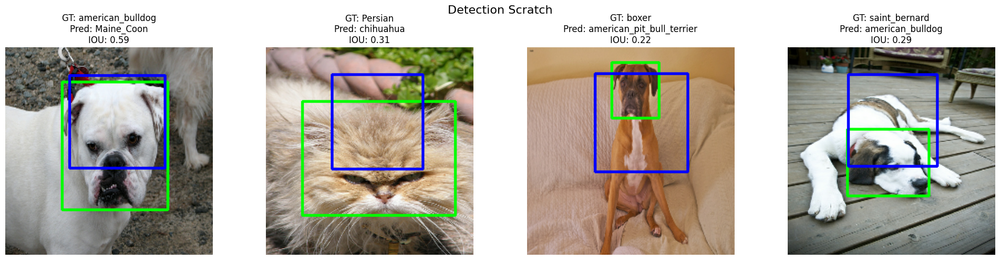

In [54]:
Visualize_Detection(det_pt, validate_dataset_final, class_names, model_name = 'Detection Pretrained')
Visualize_Detection(det_scratch, validate_dataset_final, class_names, model_name = 'Detection Scratch')

# Compute Mean Average Error and Accuracy

In [42]:
def calculateMAE(model, data):
    mae = tf.keras.metrics.MeanAbsoluteError()
    for image, label, bbox, mask in data:
        predicted = model(image, training=False)['bbox']
        mae.update_state(bbox, predicted)
    return mae.result().numpy()


def calculateAccuracy(model, data):
    accuracy = metrics.SparseCategoricalAccuracy()
    for image, label, bbox, mask in data:
        predicted = model(image, training=False)['label']
        accuracy.update_state(label, predicted)
    return accuracy.result().numpy()

In [45]:
acc_pt = calculateAccuracy(det_pt, validate_dataset_final)
print(f"Validation Label Accuracy (Pretrained Model): {acc_pt:.4f}")
mae_pt = calculateMAE(det_pt, validate_dataset_final)
print("Mean Average Error (Pretrained Model):", mae_pt)

Validation Label Accuracy (Pretrained Model): 0.9389
Mean Average Error (Pretrained Model): 0.09845525


In [46]:
acc_scratch = calculateAccuracy(det_scratch, validate_dataset_final)
print(f"Validation Label Accuracy (Scratch Model): {acc_scratch:.4f}")
mae_scratch = calculateMAE(det_scratch, validate_dataset_final)
print("Mean Average Error (Scratch Model):", mae_scratch)

Validation Label Accuracy (Scratch Model): 0.0951
Mean Average Error (Scratch Model): 0.12023202


# Evaluation

In [51]:
det_pt.compile(
    optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3),
    loss = {
        'label' : tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
        'bbox' : tf.keras.losses.MeanAbsoluteError()
    },
    metrics = {
        'label' : tf.keras.metrics.SparseCategoricalAccuracy(),
        'bbox' : tf.keras.metrics.MeanAbsoluteError(),
    }
)

result_det_pt = det_pt.evaluate(test_dataset_final.map(lambda image, label, bbox, mask: (image, {'label' : label, 'bbox' : bbox})))
print('Pretrained Object Detection Evaluateion:', result_det_pt)

115/115 ━━━━━━━━━━━━━━━━━━━━ 28s 110ms/step - bbox_loss: 0.4272 - bbox_mean_absolute_error: 0.4272 - label_loss: 0.3575 - label_sparse_categorical_accuracy: 0.9154 - loss: 0.7848
Pretrained Object Detection Evaluateion: [0.755232572555542, 0.3281320333480835, 0.4264918267726898, 0.4264870584011078, 0.9239574670791626]


In [52]:
det_scratch.compile(
    optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3),
    loss = {
        'label' : tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
        'bbox' : tf.keras.losses.MeanAbsoluteError()
    },
    metrics = {
        'label' : tf.keras.metrics.SparseCategoricalAccuracy(),
        'bbox' : tf.keras.metrics.MeanAbsoluteError(),
    }
)

result_scratch_pt = det_scratch.evaluate(test_dataset_final.map(lambda image, label, bbox, mask: (image, {'label' : label, 'bbox' : bbox})))
print('Pretrained Object Detection Evaluateion:', result_scratch_pt)

115/115 ━━━━━━━━━━━━━━━━━━━━ 28s 112ms/step - bbox_loss: 0.4372 - bbox_mean_absolute_error: 0.4372 - label_loss: 3.5839 - label_sparse_categorical_accuracy: 0.0764 - loss: 4.0211
Pretrained Object Detection Evaluateion: [4.025732040405273, 3.589745283126831, 0.43682387471199036, 0.4368405342102051, 0.07604251801967621]


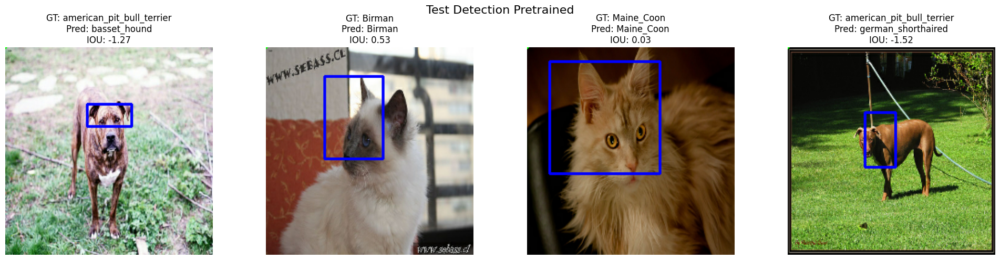

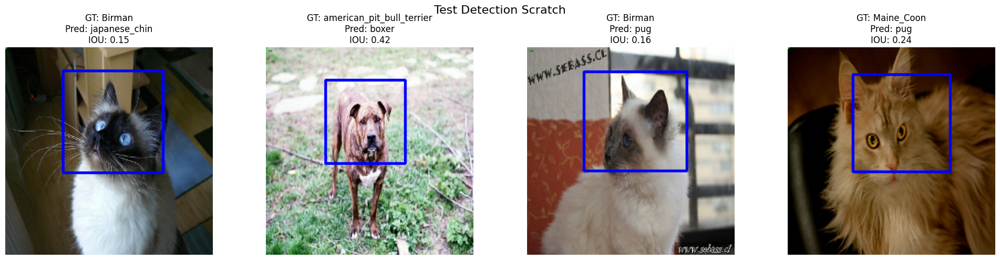

In [56]:
Visualize_Detection(det_pt, test_dataset_final, class_names, model_name = 'Test Detection Pretrained')
Visualize_Detection(det_scratch, test_dataset_final, class_names, model_name = 'Test Detection Scratch')

# Final Dataset for MobileNet

In [8]:
train_dataset_final = (train_dataset
                      .map(preprocessing_efficient, num_parallel_calls = AUTOTUNE) # Map preprocessing method to dataset
                      .batch(BATCH_SIZE)
                      .prefetch(AUTOTUNE))

test_dataset_final = (test_dataset
                      .map(preprocessing_efficient, num_parallel_calls = AUTOTUNE) 
                      .batch(BATCH_SIZE)
                      .prefetch(AUTOTUNE))

validate_dataset_final = (validate_dataset
                      .map(preprocessing_efficient, num_parallel_calls = AUTOTUNE)
                      .batch(BATCH_SIZE)
                      .prefetch(AUTOTUNE))

# Segmentation Model

In [12]:
def Encoder_Decoder_Model(pretrained = True, freeze_backbone = True, num_classes = num_classes):
    encoder = MobileNetV3Small(include_top=False,
                               input_shape=(IMG_SIZE, IMG_SIZE, 3),
                               weights='imagenet' if pretrained else None)

    encoder.trainable = not freeze_backbone

    inputs = encoder.input
    x = encoder.output

    x = layers.UpSampling2D((2, 2))(x)
    x = layers.Conv2D(256, (3, 3), padding='same', activation='relu')(x)

    x = layers.UpSampling2D((2, 2))(x)
    x = layers.Conv2D(128, (3, 3), padding='same', activation='relu')(x)

    x = layers.UpSampling2D((2, 2))(x)
    x = layers.Conv2D(64, (3, 3), padding='same', activation='relu')(x)

    x = layers.UpSampling2D((2, 2))(x)
    x = layers.Conv2D(32, (3, 3), padding='same', activation='relu')(x)

    x = layers.UpSampling2D((2, 2))(x)
    outputs = layers.Conv2D(num_classes, (1, 1), padding='same', activation='softmax')(x)

    model = Model(inputs, outputs)
    return model

# Segmentation Training Loop

In [13]:
def trainSegmentationModel(pretrained = True, freeze_backbone = True, num_classes = num_classes, epochs = 50):

    train_steps = tf.data.experimental.cardinality(train_dataset_final).numpy()
    val_steps = tf.data.experimental.cardinality(validate_dataset_final).numpy()

    model = Encoder_Decoder_Model(pretrained = pretrained, freeze_backbone = freeze_backbone, num_classes = num_classes)

    optimizer_seg = tf.keras.optimizers.Adam(learning_rate = 1e-3)
    loss_seg = losses.SparseCategoricalCrossentropy(from_logits = True)
    
    met_seg = metrics.SparseCategoricalAccuracy()
    val_met_seg = metrics.SparseCategoricalAccuracy()

    best_val_loss = float('inf')
    lr_patience = 0
    lr_factor = 0.5
    lr_min = 1e-6
    lr_patience_limit = 2

    es_patience = 20
    es_wait = 0
    best_weights = model.get_weights()

    history = {
        'accuracy' : [],
        'loss' : [],
        'val_accuracy' : [],
        'val_loss' : [],
        'learning_rate' : []
    }

    for epoch in range(epochs):
        print(f"\nEpoch {epoch+1}/{epochs}")
        progbar = tqdm(total = train_steps, desc = 'Training', unit = 'batch')

        met_seg.reset_state()
        val_met_seg.reset_state()

        total_seg_loss = 0

        for x_batch, y_batch in train_dataset_final.map(lambda img, lbl, bbox, mask: (img, mask)):
            with tf.GradientTape() as tape:
                preds = model(x_batch, training = True)
                seg_loss = loss_seg(y_batch, preds)

            grads = tape.gradient(seg_loss, model.trainable_variables)
            optimizer_seg.apply_gradients(zip(grads, model.trainable_variables))

            met_seg.update_state(y_batch, preds)

            total_seg_loss += seg_loss.numpy()

            progbar.update(1)

        progbar.close()

        val_total_seg_loss = 0

        for x_batch, y_batch in validate_dataset_final.map(lambda img, lbl, bbox, mask: (img, mask)):
            val_preds = model(x_batch, training = False)
            val_seg_loss = loss_seg(y_batch, val_preds)

            val_met_seg.update_state(y_batch, val_preds)

            val_total_seg_loss += val_seg_loss.numpy()

        avg_seg_loss = total_seg_loss / train_steps
        avg_val_seg_loss = val_total_seg_loss / val_steps

        current_lr = optimizer_seg.learning_rate
        current_lr = current_lr.numpy() if isinstance(current_lr, tf.Variable) else float(current_lr)

        print(f"{train_steps}/{train_steps} - loss: {avg_seg_loss:.4f}"
              f"- accuracy: {met_seg.result().numpy():.4f}"
              f"- val_loss: {avg_val_seg_loss:.4f}"
              f"- val_accuracy: {val_met_seg.result().numpy():.4f}"
              f"- learning_rate: {current_lr:.6f}")
        
        history['loss'].append(avg_seg_loss)
        history['accuracy'].append(met_seg.result().numpy())
        history['val_loss'].append(avg_val_seg_loss)
        history['val_accuracy'].append(val_met_seg.result().numpy())
        history['learning_rate'].append(current_lr)

        if avg_val_seg_loss < best_val_loss:
            best_val_loss = avg_val_seg_loss
            best_weights = model.get_weights()
            lr_patience = 0
            es_wait = 0
        else:
            lr_patience += 1
            es_wait += 1

        if lr_patience >= lr_patience_limit:
            old_lr = float(optimizer_seg.learning_rate.numpy())
            new_lr = max(old_lr * lr_factor, lr_min)
            optimizer_seg.learning_rate.assign(new_lr)
            print(f"Reducing learning rate from {old_lr:.6f} to {new_lr:.6f}")
            lr_patience = 0

        if es_wait >= es_patience:
            print(f"Early stopping triggered after {epoch + 1} epochs.")
            model.set_weights(best_weights)
            break
            
    return model, history

In [18]:
seg_pt, history_seg_pt = trainSegmentationModel(pretrained = True, freeze_backbone = True, num_classes = num_classes, epochs = 50)
seg_pt.save('/kaggle/working/seg_pt.keras')
with open('/kaggle/working/seg_pt.pkl', 'wb') as f:
    pickle.dump(history_seg_pt, f)

4334752/4334752 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step

Epoch 1/50


Training:   0%|          | 0/92 [00:00<?, ?batch/s]I0000 00:00:1750070953.159817      35 cuda_dnn.cc:529] Loaded cuDNN version 90300
/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/nn.py:708: UserWarning: "`sparse_categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
Training: 100%|██████████| 92/92 [00:46<00:00,  1.97batch/s]


92/92 - loss: 0.4220- accuracy: 0.8737- val_loss: 0.1905- val_accuracy: 0.9223- learning_rate: 0.001000

Epoch 2/50


Training: 100%|██████████| 92/92 [00:44<00:00,  2.08batch/s]


92/92 - loss: 0.1821- accuracy: 0.9245- val_loss: 0.1759- val_accuracy: 0.9270- learning_rate: 0.001000

Epoch 3/50


Training: 100%|██████████| 92/92 [00:44<00:00,  2.06batch/s]


92/92 - loss: 0.1661- accuracy: 0.9302- val_loss: 0.1701- val_accuracy: 0.9290- learning_rate: 0.001000

Epoch 4/50


Training: 100%|██████████| 92/92 [00:44<00:00,  2.06batch/s]


92/92 - loss: 0.1580- accuracy: 0.9329- val_loss: 0.1729- val_accuracy: 0.9284- learning_rate: 0.001000

Epoch 5/50


Training: 100%|██████████| 92/92 [00:44<00:00,  2.08batch/s]


92/92 - loss: 0.1480- accuracy: 0.9368- val_loss: 0.1749- val_accuracy: 0.9294- learning_rate: 0.001000
Reducing learning rate from 0.001000 to 0.000500

Epoch 6/50


Training: 100%|██████████| 92/92 [00:44<00:00,  2.07batch/s]


92/92 - loss: 0.1372- accuracy: 0.9411- val_loss: 0.1686- val_accuracy: 0.9301- learning_rate: 0.000500

Epoch 7/50


Training: 100%|██████████| 92/92 [00:43<00:00,  2.10batch/s]


92/92 - loss: 0.1296- accuracy: 0.9442- val_loss: 0.1717- val_accuracy: 0.9298- learning_rate: 0.000500

Epoch 8/50


Training: 100%|██████████| 92/92 [00:43<00:00,  2.10batch/s]


92/92 - loss: 0.1221- accuracy: 0.9474- val_loss: 0.1765- val_accuracy: 0.9295- learning_rate: 0.000500
Reducing learning rate from 0.000500 to 0.000250

Epoch 9/50


Training: 100%|██████████| 92/92 [00:43<00:00,  2.11batch/s]


92/92 - loss: 0.1164- accuracy: 0.9499- val_loss: 0.1879- val_accuracy: 0.9268- learning_rate: 0.000250

Epoch 10/50


Training: 100%|██████████| 92/92 [00:44<00:00,  2.09batch/s]


92/92 - loss: 0.1123- accuracy: 0.9517- val_loss: 0.1939- val_accuracy: 0.9270- learning_rate: 0.000250
Reducing learning rate from 0.000250 to 0.000125

Epoch 11/50


Training: 100%|██████████| 92/92 [00:43<00:00,  2.09batch/s]


92/92 - loss: 0.1079- accuracy: 0.9536- val_loss: 0.1851- val_accuracy: 0.9299- learning_rate: 0.000125

Epoch 12/50


Training: 100%|██████████| 92/92 [00:43<00:00,  2.10batch/s]


92/92 - loss: 0.1046- accuracy: 0.9550- val_loss: 0.1887- val_accuracy: 0.9295- learning_rate: 0.000125
Reducing learning rate from 0.000125 to 0.000063

Epoch 13/50


Training: 100%|██████████| 92/92 [00:43<00:00,  2.11batch/s]


92/92 - loss: 0.1016- accuracy: 0.9563- val_loss: 0.1900- val_accuracy: 0.9303- learning_rate: 0.000063

Epoch 14/50


Training: 100%|██████████| 92/92 [00:43<00:00,  2.11batch/s]


92/92 - loss: 0.0999- accuracy: 0.9570- val_loss: 0.1922- val_accuracy: 0.9301- learning_rate: 0.000063
Reducing learning rate from 0.000063 to 0.000031

Epoch 15/50


Training: 100%|██████████| 92/92 [00:43<00:00,  2.11batch/s]


92/92 - loss: 0.0982- accuracy: 0.9578- val_loss: 0.1926- val_accuracy: 0.9300- learning_rate: 0.000031

Epoch 16/50


Training: 100%|██████████| 92/92 [00:43<00:00,  2.09batch/s]


92/92 - loss: 0.0973- accuracy: 0.9581- val_loss: 0.1938- val_accuracy: 0.9299- learning_rate: 0.000031
Reducing learning rate from 0.000031 to 0.000016

Epoch 17/50


Training: 100%|██████████| 92/92 [00:43<00:00,  2.09batch/s]


92/92 - loss: 0.0963- accuracy: 0.9586- val_loss: 0.1946- val_accuracy: 0.9297- learning_rate: 0.000016

Epoch 18/50


Training: 100%|██████████| 92/92 [00:43<00:00,  2.09batch/s]


92/92 - loss: 0.0959- accuracy: 0.9588- val_loss: 0.1952- val_accuracy: 0.9296- learning_rate: 0.000016
Reducing learning rate from 0.000016 to 0.000008

Epoch 19/50


Training: 100%|██████████| 92/92 [00:43<00:00,  2.11batch/s]


92/92 - loss: 0.0954- accuracy: 0.9590- val_loss: 0.1957- val_accuracy: 0.9296- learning_rate: 0.000008

Epoch 20/50


Training: 100%|██████████| 92/92 [00:43<00:00,  2.11batch/s]


92/92 - loss: 0.0951- accuracy: 0.9591- val_loss: 0.1961- val_accuracy: 0.9295- learning_rate: 0.000008
Reducing learning rate from 0.000008 to 0.000004

Epoch 21/50


Training: 100%|██████████| 92/92 [00:43<00:00,  2.10batch/s]


92/92 - loss: 0.0948- accuracy: 0.9592- val_loss: 0.1964- val_accuracy: 0.9295- learning_rate: 0.000004

Epoch 22/50


Training: 100%|██████████| 92/92 [00:43<00:00,  2.11batch/s]


92/92 - loss: 0.0947- accuracy: 0.9593- val_loss: 0.1966- val_accuracy: 0.9295- learning_rate: 0.000004
Reducing learning rate from 0.000004 to 0.000002

Epoch 23/50


Training: 100%|██████████| 92/92 [00:44<00:00,  2.08batch/s]


92/92 - loss: 0.0945- accuracy: 0.9594- val_loss: 0.1967- val_accuracy: 0.9295- learning_rate: 0.000002

Epoch 24/50


Training: 100%|██████████| 92/92 [00:44<00:00,  2.09batch/s]


92/92 - loss: 0.0945- accuracy: 0.9594- val_loss: 0.1969- val_accuracy: 0.9295- learning_rate: 0.000002
Reducing learning rate from 0.000002 to 0.000001

Epoch 25/50


Training: 100%|██████████| 92/92 [00:44<00:00,  2.09batch/s]


92/92 - loss: 0.0944- accuracy: 0.9594- val_loss: 0.1969- val_accuracy: 0.9295- learning_rate: 0.000001

Epoch 26/50


Training: 100%|██████████| 92/92 [00:43<00:00,  2.10batch/s]


92/92 - loss: 0.0943- accuracy: 0.9594- val_loss: 0.1970- val_accuracy: 0.9295- learning_rate: 0.000001
Reducing learning rate from 0.000001 to 0.000001
Early stopping triggered after 26 epochs.


In [14]:
seg_scratch, history_seg_scratch = trainSegmentationModel(pretrained = False, freeze_backbone = False, num_classes = num_classes, epochs = 50)
seg_scratch.save('/kaggle/working/seg_scratch.keras')
with open('/kaggle/working/seg_scratch.pkl', 'wb') as f:
    pickle.dump(history_seg_scratch, f)


Epoch 1/50


Training:   0%|          | 0/92 [00:00<?, ?batch/s]I0000 00:00:1750075159.728099      35 cuda_dnn.cc:529] Loaded cuDNN version 90300
/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/nn.py:708: UserWarning: "`sparse_categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
Training: 100%|██████████| 92/92 [02:02<00:00,  1.34s/batch]


92/92 - loss: 0.6264- accuracy: 0.7560- val_loss: 2.6978- val_accuracy: 0.7026- learning_rate: 0.001000

Epoch 2/50


Training: 100%|██████████| 92/92 [01:57<00:00,  1.28s/batch]


92/92 - loss: 0.3970- accuracy: 0.8192- val_loss: 2.1429- val_accuracy: 0.7026- learning_rate: 0.001000

Epoch 3/50


Training: 100%|██████████| 92/92 [01:56<00:00,  1.26s/batch]


92/92 - loss: 0.3519- accuracy: 0.8428- val_loss: 1.8100- val_accuracy: 0.7026- learning_rate: 0.001000

Epoch 4/50


Training: 100%|██████████| 92/92 [01:56<00:00,  1.27s/batch]


92/92 - loss: 0.3126- accuracy: 0.8630- val_loss: 1.3874- val_accuracy: 0.7026- learning_rate: 0.001000

Epoch 5/50


Training: 100%|██████████| 92/92 [01:56<00:00,  1.27s/batch]


92/92 - loss: 0.2699- accuracy: 0.8830- val_loss: 0.9511- val_accuracy: 0.7026- learning_rate: 0.001000

Epoch 6/50


Training: 100%|██████████| 92/92 [01:57<00:00,  1.27s/batch]


92/92 - loss: 0.2571- accuracy: 0.8884- val_loss: 0.8972- val_accuracy: 0.7026- learning_rate: 0.001000

Epoch 7/50


Training: 100%|██████████| 92/92 [01:56<00:00,  1.27s/batch]


92/92 - loss: 0.2381- accuracy: 0.8975- val_loss: 0.7170- val_accuracy: 0.7026- learning_rate: 0.001000

Epoch 8/50


Training: 100%|██████████| 92/92 [01:55<00:00,  1.25s/batch]


92/92 - loss: 0.2238- accuracy: 0.9039- val_loss: 0.6825- val_accuracy: 0.7026- learning_rate: 0.001000

Epoch 9/50


Training: 100%|██████████| 92/92 [01:56<00:00,  1.27s/batch]


92/92 - loss: 0.2140- accuracy: 0.9082- val_loss: 0.6368- val_accuracy: 0.7026- learning_rate: 0.001000

Epoch 10/50


Training: 100%|██████████| 92/92 [01:56<00:00,  1.27s/batch]


92/92 - loss: 0.1975- accuracy: 0.9156- val_loss: 0.6568- val_accuracy: 0.7026- learning_rate: 0.001000

Epoch 11/50


Training: 100%|██████████| 92/92 [01:56<00:00,  1.26s/batch]


92/92 - loss: 0.1887- accuracy: 0.9196- val_loss: 0.6418- val_accuracy: 0.7026- learning_rate: 0.001000
Reducing learning rate from 0.001000 to 0.000500

Epoch 12/50


Training: 100%|██████████| 92/92 [01:57<00:00,  1.27s/batch]


92/92 - loss: 0.1684- accuracy: 0.9285- val_loss: 0.7050- val_accuracy: 0.7026- learning_rate: 0.000500

Epoch 13/50


Training: 100%|██████████| 92/92 [01:56<00:00,  1.27s/batch]


92/92 - loss: 0.1456- accuracy: 0.9382- val_loss: 0.8841- val_accuracy: 0.7026- learning_rate: 0.000500
Reducing learning rate from 0.000500 to 0.000250

Epoch 14/50


Training: 100%|██████████| 92/92 [01:55<00:00,  1.26s/batch]


92/92 - loss: 0.1316- accuracy: 0.9440- val_loss: 0.9822- val_accuracy: 0.7026- learning_rate: 0.000250

Epoch 15/50


Training: 100%|██████████| 92/92 [01:55<00:00,  1.26s/batch]


92/92 - loss: 0.1273- accuracy: 0.9457- val_loss: 1.0515- val_accuracy: 0.7026- learning_rate: 0.000250
Reducing learning rate from 0.000250 to 0.000125

Epoch 16/50


Training: 100%|██████████| 92/92 [01:54<00:00,  1.25s/batch]


92/92 - loss: 0.1203- accuracy: 0.9487- val_loss: 1.0739- val_accuracy: 0.7026- learning_rate: 0.000125

Epoch 17/50


Training: 100%|██████████| 92/92 [01:55<00:00,  1.25s/batch]


92/92 - loss: 0.1147- accuracy: 0.9510- val_loss: 1.1842- val_accuracy: 0.7026- learning_rate: 0.000125
Reducing learning rate from 0.000125 to 0.000063

Epoch 18/50


Training: 100%|██████████| 92/92 [01:55<00:00,  1.25s/batch]


92/92 - loss: 0.1117- accuracy: 0.9522- val_loss: 1.2716- val_accuracy: 0.7026- learning_rate: 0.000063

Epoch 19/50


Training: 100%|██████████| 92/92 [01:54<00:00,  1.25s/batch]


92/92 - loss: 0.1086- accuracy: 0.9536- val_loss: 1.3416- val_accuracy: 0.7026- learning_rate: 0.000063
Reducing learning rate from 0.000063 to 0.000031

Epoch 20/50


Training: 100%|██████████| 92/92 [01:55<00:00,  1.25s/batch]


92/92 - loss: 0.1062- accuracy: 0.9546- val_loss: 1.3933- val_accuracy: 0.7026- learning_rate: 0.000031

Epoch 21/50


Training: 100%|██████████| 92/92 [01:55<00:00,  1.25s/batch]


92/92 - loss: 0.1078- accuracy: 0.9539- val_loss: 1.4028- val_accuracy: 0.7026- learning_rate: 0.000031
Reducing learning rate from 0.000031 to 0.000016

Epoch 22/50


Training: 100%|██████████| 92/92 [01:55<00:00,  1.25s/batch]


92/92 - loss: 0.1057- accuracy: 0.9548- val_loss: 1.4372- val_accuracy: 0.7026- learning_rate: 0.000016

Epoch 23/50


Training: 100%|██████████| 92/92 [01:54<00:00,  1.25s/batch]


92/92 - loss: 0.1073- accuracy: 0.9541- val_loss: 1.4288- val_accuracy: 0.7026- learning_rate: 0.000016
Reducing learning rate from 0.000016 to 0.000008

Epoch 24/50


Training: 100%|██████████| 92/92 [01:55<00:00,  1.26s/batch]


92/92 - loss: 0.1030- accuracy: 0.9560- val_loss: 1.4645- val_accuracy: 0.7026- learning_rate: 0.000008

Epoch 25/50


Training: 100%|██████████| 92/92 [01:56<00:00,  1.26s/batch]


92/92 - loss: 0.1030- accuracy: 0.9560- val_loss: 1.4842- val_accuracy: 0.7026- learning_rate: 0.000008
Reducing learning rate from 0.000008 to 0.000004

Epoch 26/50


Training: 100%|██████████| 92/92 [01:55<00:00,  1.26s/batch]


92/92 - loss: 0.1031- accuracy: 0.9559- val_loss: 1.4849- val_accuracy: 0.7026- learning_rate: 0.000004

Epoch 27/50


Training: 100%|██████████| 92/92 [01:56<00:00,  1.27s/batch]


92/92 - loss: 0.1064- accuracy: 0.9544- val_loss: 1.4711- val_accuracy: 0.7026- learning_rate: 0.000004
Reducing learning rate from 0.000004 to 0.000002

Epoch 28/50


Training: 100%|██████████| 92/92 [01:55<00:00,  1.26s/batch]


92/92 - loss: 0.1050- accuracy: 0.9551- val_loss: 1.4573- val_accuracy: 0.7026- learning_rate: 0.000002

Epoch 29/50


Training: 100%|██████████| 92/92 [01:55<00:00,  1.26s/batch]


92/92 - loss: 0.1048- accuracy: 0.9551- val_loss: 1.4402- val_accuracy: 0.7026- learning_rate: 0.000002
Reducing learning rate from 0.000002 to 0.000001
Early stopping triggered after 29 epochs.


# Visualize training metrics

In [18]:
def plotResults(history, model_name = 'Model'):
    metrics = ['loss', 'accuracy']
    val_metrics = ['val_loss', 'val_accuracy']

    epochs = range(1, len(history['loss']) + 1)

    fig, axes = plt.subplots(1, 2, figsize=(25, 5))

    for i, (metric, val_metric) in enumerate(zip(metrics, val_metrics)):
        ax = axes[i]
        ax.plot(epochs, history[metric], label=f'Train {metric}')
        ax.plot(epochs, history[val_metric], label=f'Val {metric}')
        ax.set_title(metric)
        ax.set_xlabel('Epochs')
        ax.set_ylabel(metric)
        ax.legend()

    plt.suptitle(model_name, fontsize = 16)
    plt.tight_layout()
    plt.show()

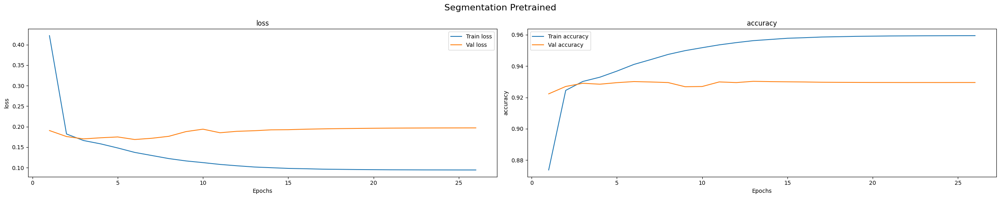

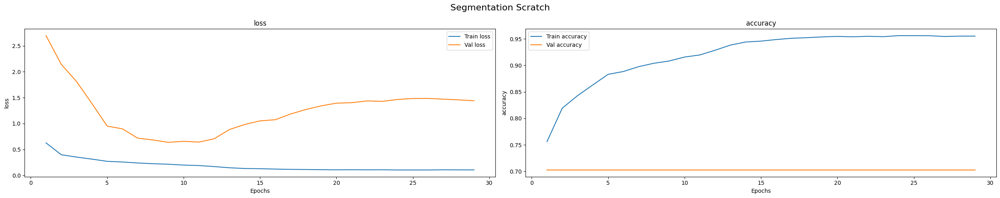

In [19]:
with open('/kaggle/input/segmentation/other/default/1/seg/seg_pt.pkl', 'rb') as f:
    history_seg_pt = pickle.load(f)
plotResults(history_seg_pt, model_name = 'Segmentation Pretrained')

with open('/kaggle/input/segmentation/other/default/1/seg/seg_scratch.pkl', 'rb') as f:
    history_seg_scratch = pickle.load(f)
plotResults(history_seg_scratch, model_name = 'Segmentation Scratch')

# Visualize Grouth True and Predicted mask

In [28]:
def Visualize_Segmentation(model, data, num_samples=4, model_name='Model'):
    for images, labels, bboxes, masks in data.take(1):
        predicted = model(images, training=False)
        predicted_masks = tf.argmax(predicted, axis=-1)

        plt.figure(figsize=(num_samples * 5, 5))
        plt.suptitle(f'{model_name}', fontsize=16, y=1.02)

        for i in range(num_samples):
            img = images[i].numpy()
            if img.max() > 1.0:
                img = img / 255.0
            elif img.min() < 0.0:
                img = (img - img.min()) / (img.max() - img.min())

            plt.subplot(3, num_samples, i + 1)
            plt.imshow(img)
            plt.title('Image')
            plt.axis('off')

            plt.subplot(3, num_samples, i + 1 + num_samples)
            plt.imshow(masks[i].numpy().squeeze(), cmap='gray')
            plt.title('Ground Truth Mask')
            plt.axis('off')

            plt.subplot(3, num_samples, i + 1 + 2 * num_samples)
            plt.imshow(predicted_masks[i].numpy().squeeze(), cmap='gray')
            plt.title('Predicted Mask')
            plt.axis('off')

        plt.tight_layout()
        plt.show()

In [29]:
seg_pt = keras.models.load_model('/kaggle/input/segmentation/other/default/1/seg/seg_pt.keras')
seg_scratch = keras.models.load_model('/kaggle/input/segmentation/other/default/1/seg/seg_scratch.keras')

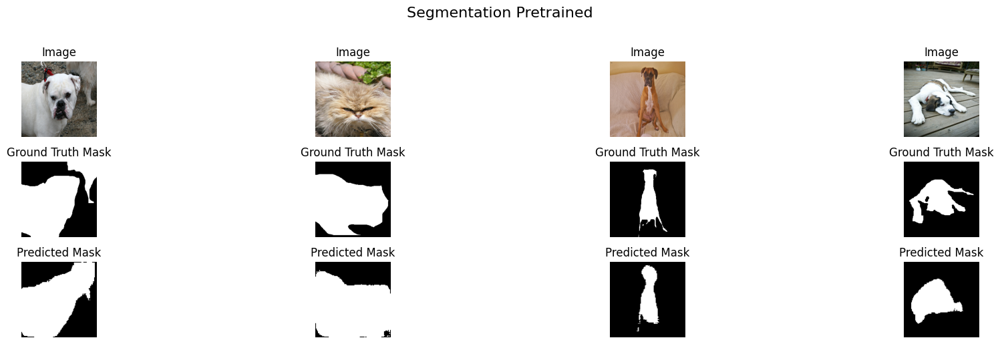

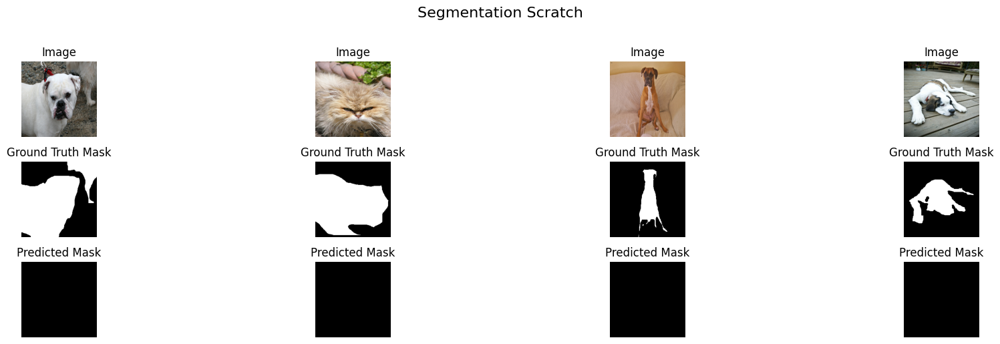

In [30]:
Visualize_Segmentation(seg_pt, validate_dataset_final, num_samples = 4, model_name = 'Segmentation Pretrained')
Visualize_Segmentation(seg_scratch, validate_dataset_final, num_samples = 4, model_name = 'Segmentation Scratch')

# Calculate Accuracy

In [25]:
def calucalteAccuracy(model, data):

    correct = 0
    total = 0

    for image, label, bbox, mask in data:
        predicted = model(image, training = False)
        predicted_masks = tf.argmax(predicted, axis = -1)

        mask = tf.squeeze(mask, axis = -1)

        predicted_flat = tf.cast(tf.reshape(predicted_masks, [-1]), tf.int32)
        mask_flat = tf.cast(tf.reshape(mask, [-1]), tf.int32)

        correct += tf.reduce_sum(tf.cast(tf.equal(predicted_flat, mask_flat), tf.int32)).numpy()
        total += tf.size(predicted_flat).numpy()

        return correct / total

In [31]:
acc_seg_pt = calucalteAccuracy(seg_pt, validate_dataset_final)
print(f"Validation Accuracy (Pretrained Model): {acc_seg_pt:.4f}")


Validation Accuracy (Pretrained Model): 0.9322


In [32]:
acc_seg_scratch = calucalteAccuracy(seg_scratch, validate_dataset_final)
print(f"Validation Accuracy (Scratch Model): {acc_seg_scratch:.4f}")

Validation Accuracy (Scratch Model): 0.7324


# Evaluation

In [37]:
seg_pt.compile(
    optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3),
    loss = losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics = [metrics.SparseCategoricalAccuracy()]
)

result_seg_pt = seg_pt.evaluate(test_dataset_final.map(lambda img, lbl, bbox, mask: (img, mask)))
print('Pretrained Semantic Segmentation Evaluateion:', result_seg_pt)

W0000 00:00:1750080766.644193      93 assert_op.cc:38] Ignoring Assert operator compile_loss/sparse_categorical_crossentropy/SparseSoftmaxCrossEntropyWithLogits/assert_equal_1/Assert/Assert


113/115 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.1793 - sparse_categorical_accuracy: 0.9281

W0000 00:00:1750080775.323861      93 assert_op.cc:38] Ignoring Assert operator compile_loss/sparse_categorical_crossentropy/SparseSoftmaxCrossEntropyWithLogits/assert_equal_1/Assert/Assert


115/115 ━━━━━━━━━━━━━━━━━━━━ 15s 76ms/step - loss: 0.1794 - sparse_categorical_accuracy: 0.9281
Pretrained Semantic Segmentation Evaluateion: [0.18451598286628723, 0.9272202253341675]


In [38]:
seg_scratch.compile(
    optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3),
    loss = losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics = [metrics.SparseCategoricalAccuracy()]
)

result_seg_scratch = seg_scratch.evaluate(test_dataset_final.map(lambda img, lbl, bbox, mask: (img, mask)))
print('Scratch Semantic Segmentation Evaluateion:', result_seg_scratch)

W0000 00:00:1750080787.037896      96 assert_op.cc:38] Ignoring Assert operator compile_loss/sparse_categorical_crossentropy/SparseSoftmaxCrossEntropyWithLogits/assert_equal_1/Assert/Assert


114/115 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.6420 - sparse_categorical_accuracy: 0.6983

W0000 00:00:1750080795.671772      95 assert_op.cc:38] Ignoring Assert operator compile_loss/sparse_categorical_crossentropy/SparseSoftmaxCrossEntropyWithLogits/assert_equal_1/Assert/Assert


115/115 ━━━━━━━━━━━━━━━━━━━━ 15s 76ms/step - loss: 0.6420 - sparse_categorical_accuracy: 0.6983
Scratch Semantic Segmentation Evaluateion: [0.639892578125, 0.7000924944877625]


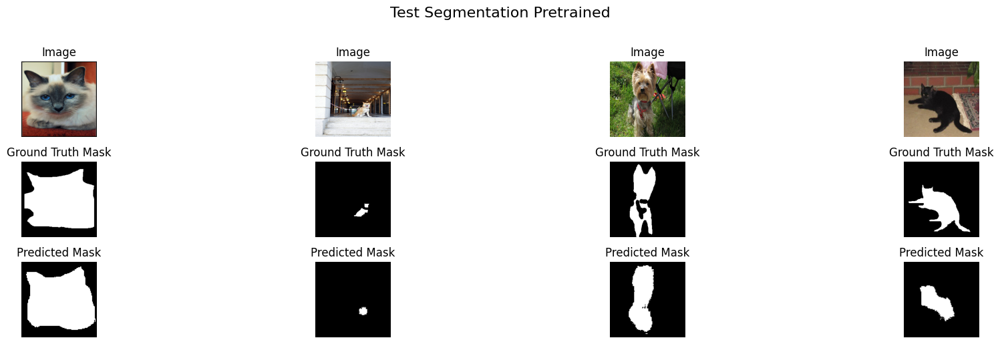

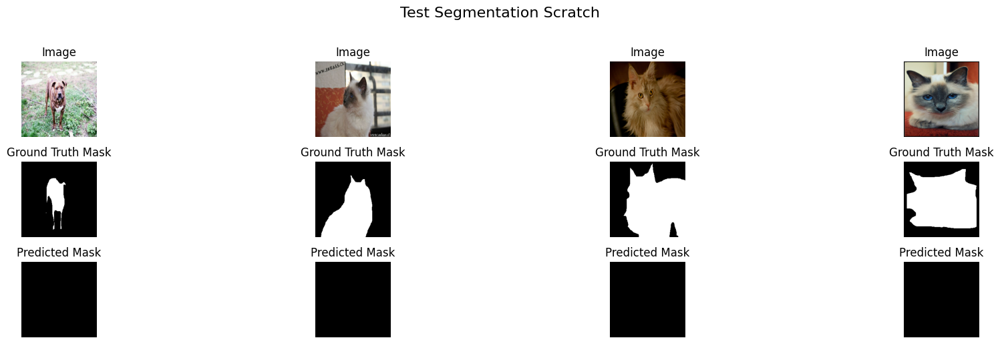

In [39]:
Visualize_Segmentation(seg_pt, test_dataset_final, num_samples = 4, model_name = 'Test Segmentation Pretrained')
Visualize_Segmentation(seg_scratch, test_dataset_final, num_samples = 4, model_name = 'Test Segmentation Scratch')

# Multi-Task Model

In [40]:
def Multi_Task_with_Backbone(pretrained = True, freeze_backbone = True, num_classes = num_classes):

    backbone = MobileNetV3Large(
        include_top = False,
        input_shape = (IMG_SIZE, IMG_SIZE, 3),
        weights = 'imagenet' if pretrained else None
    )

    backbone.trainable = not freeze_backbone

    inputs = backbone.input
    backbone_output = backbone.output

    x = layers.GlobalAveragePooling2D()(backbone_output)
    x = layers.Dense(1028, activation = 'relu')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dense(1028, activation = 'relu')(x)
    x = layers.BatchNormalization()(x)

    label_branch = layers.Dense(512, activation = 'relu')(x)
    label_branch = layers.BatchNormalization()(label_branch)
    label_output = layers.Dense(num_classes, activation = 'softmax', name = 'label')(label_branch)
    
    bbox_branch = layers.Dense(512, activation = 'relu')(x)
    bbox_branch = layers.BatchNormalization()(bbox_branch)
    bbox_output = layers.Dense(4, activation = 'sigmoid', name = 'bbox')(bbox_branch)

    mask_branch = layers.UpSampling2D((2, 2))(backbone_output)
    mask_branch = layers.Conv2D(256, (3, 3), padding='same', activation='relu')(mask_branch)
    mask_branch = layers.UpSampling2D((2, 2))(mask_branch)  
    mask_branch = layers.Conv2D(128, (3, 3), padding='same', activation='relu')(mask_branch)
    mask_branch = layers.UpSampling2D((2, 2))(mask_branch)  
    mask_branch = layers.Conv2D(64, (3, 3), padding='same', activation='relu')(mask_branch)
    mask_branch = layers.UpSampling2D((2, 2))(mask_branch)     
    mask_branch = layers.UpSampling2D((2, 2))(mask_branch)  
    mask_output = layers.Conv2D(num_classes, (1, 1), padding='same', activation='softmax', name='mask')(mask_branch)

    model = Model(inputs = inputs, outputs = {'label' : label_output, 'bbox' : bbox_output, 'mask' : mask_output})
    return model

# Multi-Task training Loop

In [44]:
def trainMultiTaskModel(pretrained = True, freeze_backbone = True, num_classes = num_classes, epochs = 50):

    train_steps = tf.data.experimental.cardinality(train_dataset_final).numpy()
    val_steps = tf.data.experimental.cardinality(validate_dataset_final).numpy()

    model = Multi_Task_with_Backbone(pretrained = pretrained, freeze_backbone = freeze_backbone, num_classes = num_classes)
    
    optimizer_det = tf.keras.optimizers.Adam(learning_rate=1e-3)
    
    loss_cls = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True)
    loss_det = tf.keras.losses.MeanAbsoluteError()
    loss_seg = losses.SparseCategoricalCrossentropy(from_logits = True)
    
    met_cls = tf.keras.metrics.SparseCategoricalAccuracy()
    met_det = tf.keras.metrics.MeanAbsoluteError()
    met_seg = metrics.SparseCategoricalAccuracy()
    
    val_met_cls = tf.keras.metrics.SparseCategoricalAccuracy()
    val_met_det = tf.keras.metrics.MeanAbsoluteError()
    val_met_seg = metrics.SparseCategoricalAccuracy()

    # Initialize manual ReduceLROnPlateau parameters
    best_val_loss = float('inf')
    lr_patience = 0
    lr_factor = 0.5
    lr_min = 1e-6
    lr_patience_limit = 2  # Number of epochs to wait before reducing LR
    
    # EarlyStopping config
    es_patience = 20
    es_wait = 0
    best_weights = model.get_weights()

    history = {
    'loss': [],
    'label_loss': [],
    'bbox_loss': [],
    'label_accuracy': [],
    'bbox_mae': [],
    'mask_accuracy' : [],
    'mask_loss' : [],
    'val_loss': [],
    'val_label_loss': [],
    'val_bbox_loss': [],
    'val_label_accuracy': [],
    'val_bbox_mae': [],
    'val_mask_accuracy' : [],
    'val_mask_loss' : [],
    'learning_rate': []
}
    
    for epoch in range(epochs):
        print(f"\nEpoch {epoch+1}/{epochs}")
        progbar = tqdm(total=train_steps, desc="Training", unit="batch")
    
        # Reset metrics at the start of each epoch
        met_cls.reset_state()
        met_det.reset_state()
        met_seg.reset_state()
        val_met_cls.reset_state()
        val_met_det.reset_state()
        val_met_seg.reset_state()
    
        total_loss = total_cls_loss = total_bbox_loss = total_seg_loss = 0
    
        # Training loop
        for x_batch, y_batch in train_dataset_final.map(lambda img, lbl, bbox, mask: (img, {'label': lbl, 'bbox': bbox, 'mask' : mask})):
            with tf.GradientTape() as tape:
                preds = model(x_batch, training=True)
                cls_loss = loss_cls(y_batch['label'], preds['label'])
                bbox_loss = loss_det(y_batch['bbox'], preds['bbox'])
                seg_loss = loss_seg(y_batch['mask'], preds['mask'])
                loss = cls_loss + bbox_loss + seg_loss
    
            grads = tape.gradient(loss, model.trainable_variables)
            optimizer_det.apply_gradients(zip(grads, model.trainable_variables))
    
            # Update metrics
            met_cls.update_state(y_batch['label'], preds['label'])
            met_det.update_state(y_batch['bbox'], preds['bbox'])
            met_seg.update_state(y_batch['mask'], preds['mask'])
    
            # Accumulate training losses
            total_loss += loss.numpy()
            total_cls_loss += cls_loss.numpy()
            total_bbox_loss += bbox_loss.numpy()
            total_seg_loss += seg_loss.numpy()
            progbar.update(1)
    
        progbar.close()
    
        # Validation loop
        val_total_loss = val_total_cls_loss = val_total_bbox_loss = val_total_seg_loss = 0
    
        for x_batch, y_batch in validate_dataset_final.map(lambda img, lbl, bbox, mask: (img, {'label': lbl, 'bbox': bbox, 'mask' : mask})):
            val_preds = model(x_batch, training=False)
            val_cls_loss = loss_cls(y_batch['label'], val_preds['label'])
            val_bbox_loss = loss_det(y_batch['bbox'], val_preds['bbox'])
            val_seg_loss = loss_seg(y_batch['mask'], val_preds['mask'])
            val_loss = val_cls_loss + val_bbox_loss + val_seg_loss
    
            val_met_cls.update_state(y_batch['label'], val_preds['label'])
            val_met_det.update_state(y_batch['bbox'], val_preds['bbox'])
            val_met_seg.update_state(y_batch['mask'], val_preds['mask'])
    
            val_total_loss += val_loss.numpy()
            val_total_cls_loss += val_cls_loss.numpy()
            val_total_bbox_loss += val_bbox_loss.numpy()
            val_total_seg_loss += val_seg_loss.numpy()
    
        # Calculate average losses over the number of steps
        avg_loss = total_loss / train_steps
        avg_cls_loss = total_cls_loss / train_steps
        avg_bbox_loss = total_bbox_loss / train_steps
        avg_seg_loss = total_seg_loss / train_steps
    
        avg_val_loss = val_total_loss / val_steps
        avg_val_cls_loss = val_total_cls_loss / val_steps
        avg_val_bbox_loss = val_total_bbox_loss / val_steps
        avg_val_seg_loss = val_total_seg_loss / val_steps
    
        # Retrieve the current learning rate
        current_lr = optimizer_det.learning_rate
        current_lr = current_lr.numpy() if isinstance(current_lr, tf.Variable) else float(current_lr)
    
        print(f"{train_steps}/{train_steps} - loss: {avg_loss:.4f} - label_loss: {avg_cls_loss:.4f} - bbox_loss: {avg_bbox_loss:.4f} - mask_loss : {avg_seg_loss:.4f}"
              f"- label_accuracy: {met_cls.result().numpy():.4f} - bbox_mae: {met_det.result().numpy():.4f} - mask_accuracy : {met_seg.result().numpy():.4f}"
              f"- val_loss: {avg_val_loss:.4f} - val_label_loss: {avg_val_cls_loss:.4f} - val_bbox_loss: {avg_val_bbox_loss:.4f} - val_mask_loss : {avg_val_seg_loss:.4f}"
              f"- val_label_accuracy: {val_met_cls.result().numpy():.4f} - val_bbox_mae: {val_met_det.result().numpy():.4f} - val_mask_accuracy : {val_met_seg.result().numpy():.4f}"
              f"- learning_rate: {current_lr:.6f}")

        history['loss'].append(avg_loss)
        history['label_loss'].append(avg_cls_loss)
        history['bbox_loss'].append(avg_bbox_loss)
        history['mask_loss'].append(avg_seg_loss)
        history['label_accuracy'].append(met_cls.result().numpy())
        history['bbox_mae'].append(met_det.result().numpy())
        history['mask_accuracy'].append(met_seg.result().numpy())
        history['val_loss'].append(avg_val_loss)
        history['val_label_loss'].append(avg_val_cls_loss)
        history['val_bbox_loss'].append(avg_val_bbox_loss)
        history['val_mask_loss'].append(avg_val_seg_loss)
        history['val_label_accuracy'].append(val_met_cls.result().numpy())
        history['val_bbox_mae'].append(val_met_det.result().numpy())
        history['val_mask_accuracy'].append(val_met_seg.result().numpy())
        history['learning_rate'].append(current_lr)

    
         # ReduceLROnPlateau logic
        if avg_val_loss < best_val_loss:
            best_val_loss = avg_val_loss
            best_weights = model.get_weights()  # Save weights here
            lr_patience = 0
            es_wait = 0  # Reset early stopping counter
        else:
            lr_patience += 1
            es_wait += 1
    
            # Reduce LR
            if lr_patience >= lr_patience_limit:
                old_lr = float(optimizer_det.learning_rate.numpy())
                new_lr = max(old_lr * lr_factor, lr_min)
                optimizer_det.learning_rate.assign(new_lr)
                print(f"Reducing learning rate from {old_lr:.6f} to {new_lr:.6f}")
                lr_patience = 0
    
            # Check EarlyStopping
            if es_wait >= es_patience:
                print(f"Early stopping triggered after {epoch + 1} epochs.")
                model.set_weights(best_weights)  # Restore the best weights
                break

    return model, history

In [45]:
multi_pt, history_multi_pt = trainMultiTaskModel(pretrained = True, freeze_backbone = True, num_classes = num_classes, epochs = 50)
multi_pt.save('/kaggle/working/multi_pt.keras')
with open('/kaggle/working/multi_pt.pkl', 'wb') as f:
    pickle.dump(history_multi_pt, f)


Epoch 1/50


Training: 100%|██████████| 92/92 [01:02<00:00,  1.48batch/s]


92/92 - loss: 1.6607 - label_loss: 0.7690 - bbox_loss: 0.2440 - mask_loss : 0.6476- label_accuracy: 0.7867 - bbox_mae: 0.2440 - mask_accuracy : 0.8671- val_loss: 0.9734 - val_label_loss: 0.5969 - val_bbox_loss: 0.1868 - val_mask_loss : 0.1897- val_label_accuracy: 0.8302 - val_bbox_mae: 0.1868 - val_mask_accuracy : 0.9216- learning_rate: 0.001000

Epoch 2/50


Training: 100%|██████████| 92/92 [01:02<00:00,  1.47batch/s]


92/92 - loss: 0.4963 - label_loss: 0.1640 - bbox_loss: 0.1532 - mask_loss : 0.1791- label_accuracy: 0.9457 - bbox_mae: 0.1532 - mask_accuracy : 0.9255- val_loss: 0.8632 - val_label_loss: 0.5494 - val_bbox_loss: 0.1412 - val_mask_loss : 0.1726- val_label_accuracy: 0.8601 - val_bbox_mae: 0.1412 - val_mask_accuracy : 0.9274- learning_rate: 0.001000

Epoch 3/50


Training: 100%|██████████| 92/92 [01:02<00:00,  1.47batch/s]


92/92 - loss: 0.3914 - label_loss: 0.1133 - bbox_loss: 0.1177 - mask_loss : 0.1604- label_accuracy: 0.9650 - bbox_mae: 0.1177 - mask_accuracy : 0.9321- val_loss: 0.8109 - val_label_loss: 0.5189 - val_bbox_loss: 0.1239 - val_mask_loss : 0.1682- val_label_accuracy: 0.8641 - val_bbox_mae: 0.1239 - val_mask_accuracy : 0.9297- learning_rate: 0.001000

Epoch 4/50


Training: 100%|██████████| 92/92 [01:03<00:00,  1.45batch/s]


92/92 - loss: 0.3282 - label_loss: 0.0782 - bbox_loss: 0.1019 - mask_loss : 0.1481- label_accuracy: 0.9738 - bbox_mae: 0.1019 - mask_accuracy : 0.9365- val_loss: 0.8037 - val_label_loss: 0.5190 - val_bbox_loss: 0.1142 - val_mask_loss : 0.1704- val_label_accuracy: 0.8641 - val_bbox_mae: 0.1142 - val_mask_accuracy : 0.9298- learning_rate: 0.001000

Epoch 5/50


Training: 100%|██████████| 92/92 [01:03<00:00,  1.45batch/s]


92/92 - loss: 0.2801 - label_loss: 0.0462 - bbox_loss: 0.0945 - mask_loss : 0.1394- label_accuracy: 0.9854 - bbox_mae: 0.0945 - mask_accuracy : 0.9400- val_loss: 0.7237 - val_label_loss: 0.4390 - val_bbox_loss: 0.1162 - val_mask_loss : 0.1685- val_label_accuracy: 0.8872 - val_bbox_mae: 0.1162 - val_mask_accuracy : 0.9309- learning_rate: 0.001000

Epoch 6/50


Training: 100%|██████████| 92/92 [01:02<00:00,  1.47batch/s]


92/92 - loss: 0.2605 - label_loss: 0.0356 - bbox_loss: 0.0888 - mask_loss : 0.1362- label_accuracy: 0.9898 - bbox_mae: 0.0888 - mask_accuracy : 0.9414- val_loss: 0.9397 - val_label_loss: 0.6504 - val_bbox_loss: 0.1107 - val_mask_loss : 0.1786- val_label_accuracy: 0.8492 - val_bbox_mae: 0.1107 - val_mask_accuracy : 0.9274- learning_rate: 0.001000

Epoch 7/50


Training: 100%|██████████| 92/92 [01:02<00:00,  1.47batch/s]


92/92 - loss: 0.2549 - label_loss: 0.0380 - bbox_loss: 0.0868 - mask_loss : 0.1301- label_accuracy: 0.9888 - bbox_mae: 0.0868 - mask_accuracy : 0.9440- val_loss: 0.8018 - val_label_loss: 0.5031 - val_bbox_loss: 0.1095 - val_mask_loss : 0.1892- val_label_accuracy: 0.8859 - val_bbox_mae: 0.1095 - val_mask_accuracy : 0.9232- learning_rate: 0.001000
Reducing learning rate from 0.001000 to 0.000500

Epoch 8/50


Training: 100%|██████████| 92/92 [01:02<00:00,  1.48batch/s]


92/92 - loss: 0.2198 - label_loss: 0.0232 - bbox_loss: 0.0782 - mask_loss : 0.1185- label_accuracy: 0.9932 - bbox_mae: 0.0782 - mask_accuracy : 0.9488- val_loss: 0.7924 - val_label_loss: 0.5094 - val_bbox_loss: 0.1032 - val_mask_loss : 0.1798- val_label_accuracy: 0.8845 - val_bbox_mae: 0.1032 - val_mask_accuracy : 0.9307- learning_rate: 0.000500

Epoch 9/50


Training: 100%|██████████| 92/92 [01:03<00:00,  1.46batch/s]


92/92 - loss: 0.1835 - label_loss: 0.0050 - bbox_loss: 0.0687 - mask_loss : 0.1098- label_accuracy: 0.9990 - bbox_mae: 0.0687 - mask_accuracy : 0.9523- val_loss: 0.7093 - val_label_loss: 0.4219 - val_bbox_loss: 0.1006 - val_mask_loss : 0.1868- val_label_accuracy: 0.8954 - val_bbox_mae: 0.1006 - val_mask_accuracy : 0.9299- learning_rate: 0.000500

Epoch 10/50


Training: 100%|██████████| 92/92 [01:02<00:00,  1.47batch/s]


92/92 - loss: 0.1656 - label_loss: 0.0014 - bbox_loss: 0.0608 - mask_loss : 0.1035- label_accuracy: 1.0000 - bbox_mae: 0.0608 - mask_accuracy : 0.9551- val_loss: 0.6949 - val_label_loss: 0.4014 - val_bbox_loss: 0.0999 - val_mask_loss : 0.1936- val_label_accuracy: 0.8995 - val_bbox_mae: 0.0999 - val_mask_accuracy : 0.9291- learning_rate: 0.000500

Epoch 11/50


Training: 100%|██████████| 92/92 [01:02<00:00,  1.47batch/s]


92/92 - loss: 0.1575 - label_loss: 0.0008 - bbox_loss: 0.0585 - mask_loss : 0.0982- label_accuracy: 1.0000 - bbox_mae: 0.0585 - mask_accuracy : 0.9574- val_loss: 0.7004 - val_label_loss: 0.3985 - val_bbox_loss: 0.1012 - val_mask_loss : 0.2006- val_label_accuracy: 0.9022 - val_bbox_mae: 0.1012 - val_mask_accuracy : 0.9286- learning_rate: 0.000500

Epoch 12/50


Training: 100%|██████████| 92/92 [01:02<00:00,  1.47batch/s]


92/92 - loss: 0.1580 - label_loss: 0.0024 - bbox_loss: 0.0617 - mask_loss : 0.0938- label_accuracy: 0.9993 - bbox_mae: 0.0617 - mask_accuracy : 0.9594- val_loss: 0.7126 - val_label_loss: 0.4024 - val_bbox_loss: 0.1005 - val_mask_loss : 0.2097- val_label_accuracy: 0.8967 - val_bbox_mae: 0.1005 - val_mask_accuracy : 0.9285- learning_rate: 0.000500
Reducing learning rate from 0.000500 to 0.000250

Epoch 13/50


Training: 100%|██████████| 92/92 [01:02<00:00,  1.47batch/s]


92/92 - loss: 0.1498 - label_loss: 0.0006 - bbox_loss: 0.0540 - mask_loss : 0.0951- label_accuracy: 1.0000 - bbox_mae: 0.0540 - mask_accuracy : 0.9588- val_loss: 0.6999 - val_label_loss: 0.4020 - val_bbox_loss: 0.0996 - val_mask_loss : 0.1983- val_label_accuracy: 0.9022 - val_bbox_mae: 0.0996 - val_mask_accuracy : 0.9296- learning_rate: 0.000250

Epoch 14/50


Training: 100%|██████████| 92/92 [01:02<00:00,  1.46batch/s]


92/92 - loss: 0.1479 - label_loss: 0.0006 - bbox_loss: 0.0525 - mask_loss : 0.0948- label_accuracy: 1.0000 - bbox_mae: 0.0525 - mask_accuracy : 0.9590- val_loss: 0.7174 - val_label_loss: 0.4000 - val_bbox_loss: 0.0962 - val_mask_loss : 0.2212- val_label_accuracy: 0.9008 - val_bbox_mae: 0.0962 - val_mask_accuracy : 0.9274- learning_rate: 0.000250
Reducing learning rate from 0.000250 to 0.000125

Epoch 15/50


Training: 100%|██████████| 92/92 [01:02<00:00,  1.47batch/s]


92/92 - loss: 0.1395 - label_loss: 0.0005 - bbox_loss: 0.0474 - mask_loss : 0.0915- label_accuracy: 1.0000 - bbox_mae: 0.0474 - mask_accuracy : 0.9604- val_loss: 0.7098 - val_label_loss: 0.4013 - val_bbox_loss: 0.0976 - val_mask_loss : 0.2108- val_label_accuracy: 0.9008 - val_bbox_mae: 0.0976 - val_mask_accuracy : 0.9301- learning_rate: 0.000125

Epoch 16/50


Training: 100%|██████████| 92/92 [01:02<00:00,  1.47batch/s]


92/92 - loss: 0.1299 - label_loss: 0.0005 - bbox_loss: 0.0435 - mask_loss : 0.0858- label_accuracy: 1.0000 - bbox_mae: 0.0435 - mask_accuracy : 0.9627- val_loss: 0.7135 - val_label_loss: 0.4004 - val_bbox_loss: 0.0966 - val_mask_loss : 0.2165- val_label_accuracy: 0.9008 - val_bbox_mae: 0.0966 - val_mask_accuracy : 0.9300- learning_rate: 0.000125
Reducing learning rate from 0.000125 to 0.000063

Epoch 17/50


Training: 100%|██████████| 92/92 [01:02<00:00,  1.47batch/s]


92/92 - loss: 0.1292 - label_loss: 0.0006 - bbox_loss: 0.0457 - mask_loss : 0.0829- label_accuracy: 1.0000 - bbox_mae: 0.0457 - mask_accuracy : 0.9641- val_loss: 0.7119 - val_label_loss: 0.4013 - val_bbox_loss: 0.0942 - val_mask_loss : 0.2164- val_label_accuracy: 0.9008 - val_bbox_mae: 0.0942 - val_mask_accuracy : 0.9298- learning_rate: 0.000063

Epoch 18/50


Training: 100%|██████████| 92/92 [01:03<00:00,  1.45batch/s]


92/92 - loss: 0.1263 - label_loss: 0.0007 - bbox_loss: 0.0440 - mask_loss : 0.0817- label_accuracy: 1.0000 - bbox_mae: 0.0440 - mask_accuracy : 0.9646- val_loss: 0.7150 - val_label_loss: 0.4023 - val_bbox_loss: 0.0942 - val_mask_loss : 0.2186- val_label_accuracy: 0.8995 - val_bbox_mae: 0.0942 - val_mask_accuracy : 0.9297- learning_rate: 0.000063
Reducing learning rate from 0.000063 to 0.000031

Epoch 19/50


Training: 100%|██████████| 92/92 [01:03<00:00,  1.45batch/s]


92/92 - loss: 0.1231 - label_loss: 0.0005 - bbox_loss: 0.0422 - mask_loss : 0.0804- label_accuracy: 1.0000 - bbox_mae: 0.0422 - mask_accuracy : 0.9652- val_loss: 0.7141 - val_label_loss: 0.4022 - val_bbox_loss: 0.0940 - val_mask_loss : 0.2178- val_label_accuracy: 0.8995 - val_bbox_mae: 0.0940 - val_mask_accuracy : 0.9299- learning_rate: 0.000031

Epoch 20/50


Training: 100%|██████████| 92/92 [01:03<00:00,  1.44batch/s]


92/92 - loss: 0.1201 - label_loss: 0.0006 - bbox_loss: 0.0399 - mask_loss : 0.0797- label_accuracy: 1.0000 - bbox_mae: 0.0399 - mask_accuracy : 0.9655- val_loss: 0.7156 - val_label_loss: 0.4022 - val_bbox_loss: 0.0941 - val_mask_loss : 0.2194- val_label_accuracy: 0.8995 - val_bbox_mae: 0.0941 - val_mask_accuracy : 0.9298- learning_rate: 0.000031
Reducing learning rate from 0.000031 to 0.000016

Epoch 21/50


Training: 100%|██████████| 92/92 [01:03<00:00,  1.45batch/s]


92/92 - loss: 0.1229 - label_loss: 0.0009 - bbox_loss: 0.0429 - mask_loss : 0.0790- label_accuracy: 1.0000 - bbox_mae: 0.0429 - mask_accuracy : 0.9658- val_loss: 0.7161 - val_label_loss: 0.4031 - val_bbox_loss: 0.0937 - val_mask_loss : 0.2193- val_label_accuracy: 0.8995 - val_bbox_mae: 0.0937 - val_mask_accuracy : 0.9298- learning_rate: 0.000016

Epoch 22/50


Training: 100%|██████████| 92/92 [01:02<00:00,  1.47batch/s]


92/92 - loss: 0.1197 - label_loss: 0.0007 - bbox_loss: 0.0403 - mask_loss : 0.0787- label_accuracy: 1.0000 - bbox_mae: 0.0403 - mask_accuracy : 0.9659- val_loss: 0.7175 - val_label_loss: 0.4035 - val_bbox_loss: 0.0939 - val_mask_loss : 0.2201- val_label_accuracy: 0.8995 - val_bbox_mae: 0.0939 - val_mask_accuracy : 0.9298- learning_rate: 0.000016
Reducing learning rate from 0.000016 to 0.000008

Epoch 23/50


Training: 100%|██████████| 92/92 [01:02<00:00,  1.47batch/s]


92/92 - loss: 0.1188 - label_loss: 0.0007 - bbox_loss: 0.0399 - mask_loss : 0.0783- label_accuracy: 1.0000 - bbox_mae: 0.0399 - mask_accuracy : 0.9661- val_loss: 0.7177 - val_label_loss: 0.4039 - val_bbox_loss: 0.0936 - val_mask_loss : 0.2202- val_label_accuracy: 0.8995 - val_bbox_mae: 0.0936 - val_mask_accuracy : 0.9298- learning_rate: 0.000008

Epoch 24/50


Training: 100%|██████████| 92/92 [01:02<00:00,  1.47batch/s]


92/92 - loss: 0.1162 - label_loss: 0.0006 - bbox_loss: 0.0375 - mask_loss : 0.0781- label_accuracy: 1.0000 - bbox_mae: 0.0375 - mask_accuracy : 0.9662- val_loss: 0.7182 - val_label_loss: 0.4040 - val_bbox_loss: 0.0937 - val_mask_loss : 0.2206- val_label_accuracy: 0.8995 - val_bbox_mae: 0.0937 - val_mask_accuracy : 0.9298- learning_rate: 0.000008
Reducing learning rate from 0.000008 to 0.000004

Epoch 25/50


Training: 100%|██████████| 92/92 [01:02<00:00,  1.48batch/s]


92/92 - loss: 0.1128 - label_loss: 0.0004 - bbox_loss: 0.0345 - mask_loss : 0.0779- label_accuracy: 1.0000 - bbox_mae: 0.0345 - mask_accuracy : 0.9663- val_loss: 0.7181 - val_label_loss: 0.4040 - val_bbox_loss: 0.0934 - val_mask_loss : 0.2207- val_label_accuracy: 0.8995 - val_bbox_mae: 0.0934 - val_mask_accuracy : 0.9298- learning_rate: 0.000004

Epoch 26/50


Training: 100%|██████████| 92/92 [01:02<00:00,  1.47batch/s]


92/92 - loss: 0.1176 - label_loss: 0.0007 - bbox_loss: 0.0392 - mask_loss : 0.0778- label_accuracy: 1.0000 - bbox_mae: 0.0392 - mask_accuracy : 0.9663- val_loss: 0.7186 - val_label_loss: 0.4042 - val_bbox_loss: 0.0935 - val_mask_loss : 0.2208- val_label_accuracy: 0.8995 - val_bbox_mae: 0.0935 - val_mask_accuracy : 0.9298- learning_rate: 0.000004
Reducing learning rate from 0.000004 to 0.000002

Epoch 27/50


Training: 100%|██████████| 92/92 [01:02<00:00,  1.48batch/s]


92/92 - loss: 0.1146 - label_loss: 0.0005 - bbox_loss: 0.0365 - mask_loss : 0.0776- label_accuracy: 1.0000 - bbox_mae: 0.0365 - mask_accuracy : 0.9664- val_loss: 0.7182 - val_label_loss: 0.4038 - val_bbox_loss: 0.0934 - val_mask_loss : 0.2209- val_label_accuracy: 0.8995 - val_bbox_mae: 0.0934 - val_mask_accuracy : 0.9298- learning_rate: 0.000002

Epoch 28/50


Training: 100%|██████████| 92/92 [01:02<00:00,  1.47batch/s]


92/92 - loss: 0.1142 - label_loss: 0.0005 - bbox_loss: 0.0361 - mask_loss : 0.0776- label_accuracy: 1.0000 - bbox_mae: 0.0361 - mask_accuracy : 0.9664- val_loss: 0.7181 - val_label_loss: 0.4036 - val_bbox_loss: 0.0934 - val_mask_loss : 0.2210- val_label_accuracy: 0.8995 - val_bbox_mae: 0.0934 - val_mask_accuracy : 0.9298- learning_rate: 0.000002
Reducing learning rate from 0.000002 to 0.000001

Epoch 29/50


Training: 100%|██████████| 92/92 [01:02<00:00,  1.47batch/s]


92/92 - loss: 0.1117 - label_loss: 0.0004 - bbox_loss: 0.0337 - mask_loss : 0.0775- label_accuracy: 1.0000 - bbox_mae: 0.0337 - mask_accuracy : 0.9664- val_loss: 0.7183 - val_label_loss: 0.4038 - val_bbox_loss: 0.0934 - val_mask_loss : 0.2211- val_label_accuracy: 0.8995 - val_bbox_mae: 0.0934 - val_mask_accuracy : 0.9298- learning_rate: 0.000001

Epoch 30/50


Training: 100%|██████████| 92/92 [01:02<00:00,  1.47batch/s]


92/92 - loss: 0.1141 - label_loss: 0.0005 - bbox_loss: 0.0361 - mask_loss : 0.0775- label_accuracy: 1.0000 - bbox_mae: 0.0361 - mask_accuracy : 0.9664- val_loss: 0.7182 - val_label_loss: 0.4037 - val_bbox_loss: 0.0934 - val_mask_loss : 0.2211- val_label_accuracy: 0.8995 - val_bbox_mae: 0.0934 - val_mask_accuracy : 0.9298- learning_rate: 0.000001
Reducing learning rate from 0.000001 to 0.000001
Early stopping triggered after 30 epochs.


In [46]:
multi_scratch, history_multi_scratch = trainMultiTaskModel(pretrained = False, freeze_backbone = False, num_classes = num_classes, epochs = 50)
multi_scratch.save('/kaggle/working/multi_scratch.keras')
with open('/kaggle/working/multi_scratch.pkl', 'wb') as f:
    pickle.dump(history_multi_scratch, f)


Epoch 1/50


Training: 100%|██████████| 92/92 [02:31<00:00,  1.65s/batch]


92/92 - loss: 4.6995 - label_loss: 3.8709 - bbox_loss: 0.1725 - mask_loss : 0.6560- label_accuracy: 0.0431 - bbox_mae: 0.1725 - mask_accuracy : 0.7247- val_loss: 5.4440 - val_label_loss: 3.6855 - val_bbox_loss: 0.1244 - val_mask_loss : 1.6341- val_label_accuracy: 0.0190 - val_bbox_mae: 0.1244 - val_mask_accuracy : 0.7026- learning_rate: 0.001000

Epoch 2/50


Training: 100%|██████████| 92/92 [02:32<00:00,  1.65s/batch]


92/92 - loss: 4.2641 - label_loss: 3.6494 - bbox_loss: 0.1413 - mask_loss : 0.4734- label_accuracy: 0.0506 - bbox_mae: 0.1413 - mask_accuracy : 0.7756- val_loss: 4.6734 - val_label_loss: 3.7456 - val_bbox_loss: 0.1196 - val_mask_loss : 0.8083- val_label_accuracy: 0.0380 - val_bbox_mae: 0.1196 - val_mask_accuracy : 0.7026- learning_rate: 0.001000

Epoch 3/50


Training: 100%|██████████| 92/92 [02:31<00:00,  1.65s/batch]


92/92 - loss: 4.1394 - label_loss: 3.5504 - bbox_loss: 0.1315 - mask_loss : 0.4574- label_accuracy: 0.0618 - bbox_mae: 0.1315 - mask_accuracy : 0.7853- val_loss: 4.6233 - val_label_loss: 3.8046 - val_bbox_loss: 0.1193 - val_mask_loss : 0.6995- val_label_accuracy: 0.0258 - val_bbox_mae: 0.1193 - val_mask_accuracy : 0.7026- learning_rate: 0.001000

Epoch 4/50


Training: 100%|██████████| 92/92 [02:30<00:00,  1.63s/batch]


92/92 - loss: 4.0115 - label_loss: 3.4305 - bbox_loss: 0.1298 - mask_loss : 0.4512- label_accuracy: 0.0754 - bbox_mae: 0.1298 - mask_accuracy : 0.7884- val_loss: 4.5651 - val_label_loss: 3.8040 - val_bbox_loss: 0.1255 - val_mask_loss : 0.6356- val_label_accuracy: 0.0380 - val_bbox_mae: 0.1255 - val_mask_accuracy : 0.7026- learning_rate: 0.001000

Epoch 5/50


Training: 100%|██████████| 92/92 [02:30<00:00,  1.63s/batch]


92/92 - loss: 3.8822 - label_loss: 3.3140 - bbox_loss: 0.1282 - mask_loss : 0.4400- label_accuracy: 0.0954 - bbox_mae: 0.1282 - mask_accuracy : 0.7951- val_loss: 4.4993 - val_label_loss: 3.7564 - val_bbox_loss: 0.1227 - val_mask_loss : 0.6202- val_label_accuracy: 0.0258 - val_bbox_mae: 0.1227 - val_mask_accuracy : 0.7026- learning_rate: 0.001000

Epoch 6/50


Training: 100%|██████████| 92/92 [02:30<00:00,  1.64s/batch]


92/92 - loss: 3.7731 - label_loss: 3.2087 - bbox_loss: 0.1286 - mask_loss : 0.4358- label_accuracy: 0.1301 - bbox_mae: 0.1286 - mask_accuracy : 0.7975- val_loss: 4.4581 - val_label_loss: 3.7445 - val_bbox_loss: 0.1167 - val_mask_loss : 0.5969- val_label_accuracy: 0.0231 - val_bbox_mae: 0.1167 - val_mask_accuracy : 0.7026- learning_rate: 0.001000

Epoch 7/50


Training: 100%|██████████| 92/92 [02:31<00:00,  1.65s/batch]


92/92 - loss: 3.6212 - label_loss: 3.0703 - bbox_loss: 0.1269 - mask_loss : 0.4239- label_accuracy: 0.1440 - bbox_mae: 0.1269 - mask_accuracy : 0.8040- val_loss: 4.5321 - val_label_loss: 3.7920 - val_bbox_loss: 0.1214 - val_mask_loss : 0.6187- val_label_accuracy: 0.0231 - val_bbox_mae: 0.1214 - val_mask_accuracy : 0.7026- learning_rate: 0.001000

Epoch 8/50


Training: 100%|██████████| 92/92 [02:30<00:00,  1.64s/batch]


92/92 - loss: 3.5296 - label_loss: 2.9844 - bbox_loss: 0.1257 - mask_loss : 0.4195- label_accuracy: 0.1729 - bbox_mae: 0.1257 - mask_accuracy : 0.8070- val_loss: 4.6370 - val_label_loss: 3.9346 - val_bbox_loss: 0.1205 - val_mask_loss : 0.5820- val_label_accuracy: 0.0231 - val_bbox_mae: 0.1205 - val_mask_accuracy : 0.7026- learning_rate: 0.001000
Reducing learning rate from 0.001000 to 0.000500

Epoch 9/50


Training: 100%|██████████| 92/92 [02:30<00:00,  1.64s/batch]


92/92 - loss: 3.1744 - label_loss: 2.6615 - bbox_loss: 0.1153 - mask_loss : 0.3976- label_accuracy: 0.2289 - bbox_mae: 0.1153 - mask_accuracy : 0.8181- val_loss: 4.6122 - val_label_loss: 3.8971 - val_bbox_loss: 0.1178 - val_mask_loss : 0.5973- val_label_accuracy: 0.0231 - val_bbox_mae: 0.1178 - val_mask_accuracy : 0.7026- learning_rate: 0.000500

Epoch 10/50


Training: 100%|██████████| 92/92 [02:31<00:00,  1.65s/batch]


92/92 - loss: 2.8122 - label_loss: 2.3104 - bbox_loss: 0.1140 - mask_loss : 0.3879- label_accuracy: 0.3128 - bbox_mae: 0.1140 - mask_accuracy : 0.8230- val_loss: 4.8191 - val_label_loss: 4.1122 - val_bbox_loss: 0.1166 - val_mask_loss : 0.5903- val_label_accuracy: 0.0326 - val_bbox_mae: 0.1166 - val_mask_accuracy : 0.7026- learning_rate: 0.000500
Reducing learning rate from 0.000500 to 0.000250

Epoch 11/50


Training: 100%|██████████| 92/92 [02:32<00:00,  1.66s/batch]


92/92 - loss: 2.3138 - label_loss: 1.8297 - bbox_loss: 0.1104 - mask_loss : 0.3736- label_accuracy: 0.4524 - bbox_mae: 0.1104 - mask_accuracy : 0.8306- val_loss: 4.9396 - val_label_loss: 4.2503 - val_bbox_loss: 0.1200 - val_mask_loss : 0.5693- val_label_accuracy: 0.0177 - val_bbox_mae: 0.1200 - val_mask_accuracy : 0.7026- learning_rate: 0.000250

Epoch 12/50


Training: 100%|██████████| 92/92 [02:32<00:00,  1.65s/batch]


92/92 - loss: 1.9193 - label_loss: 1.4427 - bbox_loss: 0.1100 - mask_loss : 0.3666- label_accuracy: 0.5659 - bbox_mae: 0.1100 - mask_accuracy : 0.8341- val_loss: 5.4107 - val_label_loss: 4.7238 - val_bbox_loss: 0.1166 - val_mask_loss : 0.5703- val_label_accuracy: 0.0177 - val_bbox_mae: 0.1166 - val_mask_accuracy : 0.7026- learning_rate: 0.000250
Reducing learning rate from 0.000250 to 0.000125

Epoch 13/50


Training: 100%|██████████| 92/92 [02:29<00:00,  1.63s/batch]


92/92 - loss: 1.6549 - label_loss: 1.1897 - bbox_loss: 0.1084 - mask_loss : 0.3567- label_accuracy: 0.6376 - bbox_mae: 0.1084 - mask_accuracy : 0.8391- val_loss: 5.8220 - val_label_loss: 5.1361 - val_bbox_loss: 0.1187 - val_mask_loss : 0.5672- val_label_accuracy: 0.0177 - val_bbox_mae: 0.1187 - val_mask_accuracy : 0.7026- learning_rate: 0.000125

Epoch 14/50


Training: 100%|██████████| 92/92 [02:30<00:00,  1.64s/batch]


92/92 - loss: 1.3851 - label_loss: 0.9243 - bbox_loss: 0.1071 - mask_loss : 0.3537- label_accuracy: 0.7337 - bbox_mae: 0.1071 - mask_accuracy : 0.8405- val_loss: 6.4875 - val_label_loss: 5.7998 - val_bbox_loss: 0.1226 - val_mask_loss : 0.5651- val_label_accuracy: 0.0177 - val_bbox_mae: 0.1226 - val_mask_accuracy : 0.7026- learning_rate: 0.000125
Reducing learning rate from 0.000125 to 0.000063

Epoch 15/50


Training: 100%|██████████| 92/92 [02:31<00:00,  1.64s/batch]


92/92 - loss: 1.1810 - label_loss: 0.7292 - bbox_loss: 0.1048 - mask_loss : 0.3470- label_accuracy: 0.7959 - bbox_mae: 0.1048 - mask_accuracy : 0.8438- val_loss: 6.9233 - val_label_loss: 6.2383 - val_bbox_loss: 0.1251 - val_mask_loss : 0.5599- val_label_accuracy: 0.0177 - val_bbox_mae: 0.1251 - val_mask_accuracy : 0.7026- learning_rate: 0.000063

Epoch 16/50


Training: 100%|██████████| 92/92 [02:31<00:00,  1.64s/batch]


92/92 - loss: 0.9493 - label_loss: 0.5022 - bbox_loss: 0.1034 - mask_loss : 0.3436- label_accuracy: 0.8882 - bbox_mae: 0.1034 - mask_accuracy : 0.8453- val_loss: 7.5654 - val_label_loss: 6.8826 - val_bbox_loss: 0.1262 - val_mask_loss : 0.5566- val_label_accuracy: 0.0177 - val_bbox_mae: 0.1262 - val_mask_accuracy : 0.7026- learning_rate: 0.000063
Reducing learning rate from 0.000063 to 0.000031

Epoch 17/50


Training: 100%|██████████| 92/92 [02:31<00:00,  1.64s/batch]


92/92 - loss: 0.8431 - label_loss: 0.4018 - bbox_loss: 0.1023 - mask_loss : 0.3391- label_accuracy: 0.9215 - bbox_mae: 0.1023 - mask_accuracy : 0.8474- val_loss: 8.4563 - val_label_loss: 7.7740 - val_bbox_loss: 0.1276 - val_mask_loss : 0.5546- val_label_accuracy: 0.0177 - val_bbox_mae: 0.1276 - val_mask_accuracy : 0.7026- learning_rate: 0.000031

Epoch 18/50


Training: 100%|██████████| 92/92 [02:30<00:00,  1.64s/batch]


92/92 - loss: 0.7776 - label_loss: 0.3395 - bbox_loss: 0.1014 - mask_loss : 0.3367- label_accuracy: 0.9314 - bbox_mae: 0.1014 - mask_accuracy : 0.8486- val_loss: 9.0223 - val_label_loss: 8.3428 - val_bbox_loss: 0.1275 - val_mask_loss : 0.5520- val_label_accuracy: 0.0177 - val_bbox_mae: 0.1275 - val_mask_accuracy : 0.7026- learning_rate: 0.000031
Reducing learning rate from 0.000031 to 0.000016

Epoch 19/50


Training: 100%|██████████| 92/92 [02:30<00:00,  1.64s/batch]


92/92 - loss: 0.7673 - label_loss: 0.3322 - bbox_loss: 0.1003 - mask_loss : 0.3347- label_accuracy: 0.9297 - bbox_mae: 0.1003 - mask_accuracy : 0.8493- val_loss: 9.5540 - val_label_loss: 8.8758 - val_bbox_loss: 0.1282 - val_mask_loss : 0.5501- val_label_accuracy: 0.0177 - val_bbox_mae: 0.1282 - val_mask_accuracy : 0.7026- learning_rate: 0.000016

Epoch 20/50


Training: 100%|██████████| 92/92 [02:31<00:00,  1.65s/batch]


92/92 - loss: 0.6830 - label_loss: 0.2519 - bbox_loss: 0.0991 - mask_loss : 0.3320- label_accuracy: 0.9541 - bbox_mae: 0.0991 - mask_accuracy : 0.8508- val_loss: 9.9473 - val_label_loss: 9.2681 - val_bbox_loss: 0.1311 - val_mask_loss : 0.5481- val_label_accuracy: 0.0177 - val_bbox_mae: 0.1311 - val_mask_accuracy : 0.7026- learning_rate: 0.000016
Reducing learning rate from 0.000016 to 0.000008

Epoch 21/50


Training: 100%|██████████| 92/92 [02:31<00:00,  1.65s/batch]


92/92 - loss: 0.6777 - label_loss: 0.2475 - bbox_loss: 0.0988 - mask_loss : 0.3314- label_accuracy: 0.9541 - bbox_mae: 0.0988 - mask_accuracy : 0.8509- val_loss: 10.3122 - val_label_loss: 9.6340 - val_bbox_loss: 0.1320 - val_mask_loss : 0.5463- val_label_accuracy: 0.0177 - val_bbox_mae: 0.1320 - val_mask_accuracy : 0.7026- learning_rate: 0.000008

Epoch 22/50


Training: 100%|██████████| 92/92 [02:32<00:00,  1.65s/batch]


92/92 - loss: 0.6475 - label_loss: 0.2199 - bbox_loss: 0.0979 - mask_loss : 0.3298- label_accuracy: 0.9637 - bbox_mae: 0.0979 - mask_accuracy : 0.8519- val_loss: 10.5817 - val_label_loss: 9.9034 - val_bbox_loss: 0.1340 - val_mask_loss : 0.5443- val_label_accuracy: 0.0177 - val_bbox_mae: 0.1340 - val_mask_accuracy : 0.7026- learning_rate: 0.000008
Reducing learning rate from 0.000008 to 0.000004

Epoch 23/50


Training: 100%|██████████| 92/92 [02:32<00:00,  1.66s/batch]


92/92 - loss: 0.7164 - label_loss: 0.2859 - bbox_loss: 0.0995 - mask_loss : 0.3310- label_accuracy: 0.9402 - bbox_mae: 0.0995 - mask_accuracy : 0.8511- val_loss: 10.7976 - val_label_loss: 10.1187 - val_bbox_loss: 0.1361 - val_mask_loss : 0.5429- val_label_accuracy: 0.0177 - val_bbox_mae: 0.1361 - val_mask_accuracy : 0.7026- learning_rate: 0.000004

Epoch 24/50


Training: 100%|██████████| 92/92 [02:31<00:00,  1.64s/batch]


92/92 - loss: 0.6478 - label_loss: 0.2204 - bbox_loss: 0.0980 - mask_loss : 0.3294- label_accuracy: 0.9630 - bbox_mae: 0.0980 - mask_accuracy : 0.8520- val_loss: 11.0603 - val_label_loss: 10.3808 - val_bbox_loss: 0.1382 - val_mask_loss : 0.5412- val_label_accuracy: 0.0177 - val_bbox_mae: 0.1382 - val_mask_accuracy : 0.7026- learning_rate: 0.000004
Reducing learning rate from 0.000004 to 0.000002

Epoch 25/50


Training: 100%|██████████| 92/92 [02:33<00:00,  1.66s/batch]


92/92 - loss: 0.6752 - label_loss: 0.2476 - bbox_loss: 0.0983 - mask_loss : 0.3294- label_accuracy: 0.9569 - bbox_mae: 0.0983 - mask_accuracy : 0.8519- val_loss: 11.2435 - val_label_loss: 10.5638 - val_bbox_loss: 0.1400 - val_mask_loss : 0.5397- val_label_accuracy: 0.0177 - val_bbox_mae: 0.1400 - val_mask_accuracy : 0.7026- learning_rate: 0.000002

Epoch 26/50


Training: 100%|██████████| 92/92 [02:31<00:00,  1.65s/batch]


92/92 - loss: 0.6865 - label_loss: 0.2583 - bbox_loss: 0.0987 - mask_loss : 0.3295- label_accuracy: 0.9487 - bbox_mae: 0.0987 - mask_accuracy : 0.8520- val_loss: 11.3853 - val_label_loss: 10.7050 - val_bbox_loss: 0.1423 - val_mask_loss : 0.5381- val_label_accuracy: 0.0177 - val_bbox_mae: 0.1423 - val_mask_accuracy : 0.7026- learning_rate: 0.000002
Reducing learning rate from 0.000002 to 0.000001
Early stopping triggered after 26 epochs.


# Visualize Training metrics

In [47]:
def plotResults(history, model_name = 'Model'):
    metrics = ['bbox_loss', 'bbox_mae', 'label_accuracy', 'label_loss', 'loss', 'mask_loss', 'mask_accuracy']
    val_metrics = ['val_bbox_loss', 'val_bbox_mae', 'val_label_accuracy', 'val_label_loss', 'val_loss', 'val_mask_loss', 'val_mask_accuracy']

    epochs = range(1, len(history['loss']) + 1)

    fig, axes = plt.subplots(1, 7, figsize=(25, 5))

    for i, (metric, val_metric) in enumerate(zip(metrics, val_metrics)):
        ax = axes[i]
        ax.plot(epochs, history[metric], label=f'Train {metric}')
        ax.plot(epochs, history[val_metric], label=f'Val {metric}')
        ax.set_title(metric)
        ax.set_xlabel('Epochs')
        ax.set_ylabel(metric)
        ax.legend()

    plt.suptitle(model_name, fontsize = 16)
    plt.tight_layout()
    plt.show()

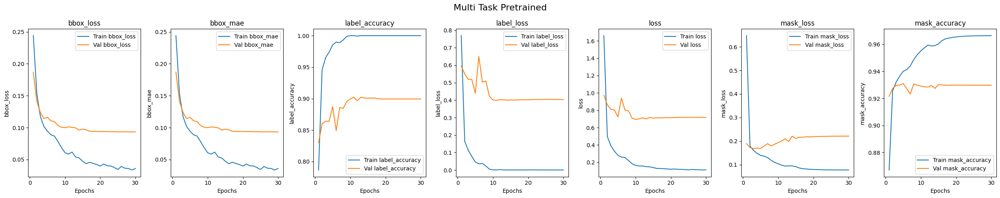

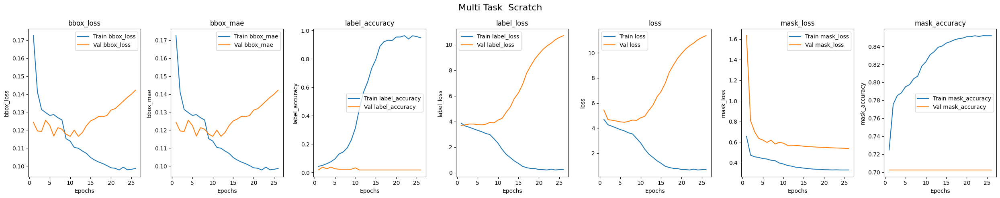

In [48]:
with open('/kaggle/working/multi_pt.pkl', 'rb') as f:
    history_multi_pt = pickle.load(f)
plotResults(history_multi_pt, model_name = 'Multi Task Pretrained')

with open('/kaggle/working/multi_scratch.pkl', 'rb') as f:
    history_multi_scratch = pickle.load(f)
plotResults(history_multi_scratch, model_name = 'Multi Task  Scratch')

# Visualize Grouth True and Predicted

In [52]:
def visualize_multi_task_outputs(model, dataset, class_labels, num_samples=4, model_name = 'Model'):
    for batch in dataset.take(1):
        images, gt_labels, gt_bboxes, gt_masks = batch

        predictions = model(images, training=False)
        pred_labels = tf.argmax(predictions['label'], axis=1).numpy()
        pred_bboxes = predictions['bbox'].numpy()
        pred_masks = tf.argmax(predictions['mask'], axis=-1).numpy()

        images = images.numpy() 
        gt_labels = gt_labels.numpy()
        gt_bboxes = gt_bboxes.numpy()
        gt_masks = tf.squeeze(gt_masks, axis=-1).numpy()

        fig, axes = plt.subplots(1, num_samples, figsize=(5 * num_samples, 5))

        for i in range(num_samples):
            img = images[i]
            gt_mask = gt_masks[i]
            pred_mask = pred_masks[i]

            gt_mask = (gt_mask > 0).astype(np.uint8)
            pred_mask = (pred_mask > 0).astype(np.uint8)

            img_bgr = cv2.cvtColor(img, cv2.COLOR_RGB2BGR).astype(np.float32)

            green = np.zeros_like(img_bgr)
            green[gt_mask == 1] = [0, 255, 0]

            red = np.zeros_like(img_bgr)
            red[pred_mask == 1] = [0, 0, 255]

            overlay = cv2.addWeighted(img_bgr, 0.75, green.astype(np.float32), 0.25, 0)
            overlay = cv2.addWeighted(overlay, 0.85, red.astype(np.float32), 0.15, 0)
            overlay = overlay.clip(0, 255).astype(np.uint8)

            y_min, x_min, y_max, x_max = gt_bboxes[i]
            start_point_gt = (int(x_min * IMG_SIZE), int(y_min * IMG_SIZE))
            end_point_gt = (int(x_max * IMG_SIZE), int(y_max * IMG_SIZE))
            cv2.rectangle(overlay, start_point_gt, end_point_gt, (0, 255, 0), 2)

            y_min, x_min, y_max, x_max = pred_bboxes[i]
            start_point_pred = (int(x_min * IMG_SIZE), int(y_min * IMG_SIZE))
            end_point_pred = (int(x_max * IMG_SIZE), int(y_max * IMG_SIZE))
            cv2.rectangle(overlay, start_point_pred, end_point_pred, (0, 0, 255), 2)

            overlay_rgb = cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB)

            axes[i].imshow(overlay_rgb)
            axes[i].set_title(
                f"GT: {class_labels[gt_labels[i]]} | Pred: {class_labels[pred_labels[i]]}\nGreen: GT, Red: Pred",
                fontsize=9
            )
            axes[i].axis('off')

        plt.suptitle(model_name, fontsize=16)
        plt.tight_layout()
        plt.show()

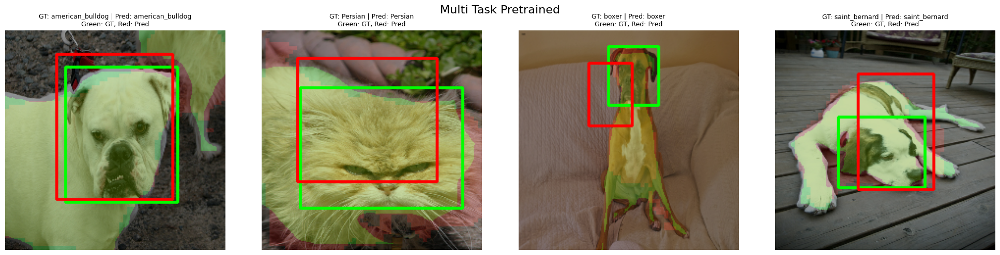

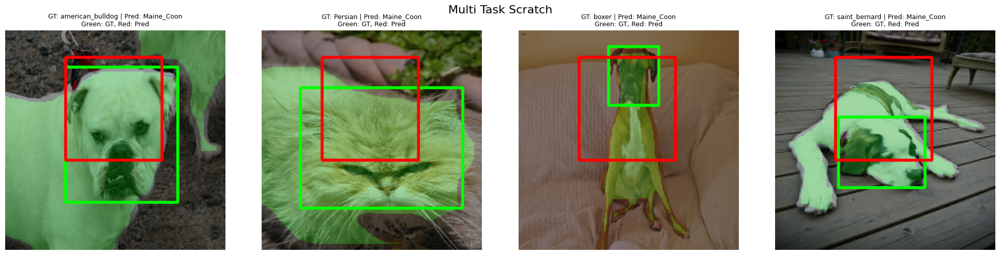

In [53]:
visualize_multi_task_outputs(multi_pt, validate_dataset_final, class_labels = class_names, model_name = 'Multi Task Pretrained')
visualize_multi_task_outputs(multi_scratch, validate_dataset_final, class_labels = class_names, model_name = 'Multi Task Scratch')

# Evaluation

In [54]:
multi_pt.compile(
    optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3),
    loss = {
        'label' : tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
        'bbox' : tf.keras.losses.MeanAbsoluteError(),
        'mask' : losses.SparseCategoricalCrossentropy(from_logits = True)
    },
    metrics = {
        'label' : tf.keras.metrics.SparseCategoricalAccuracy(),
        'bbox' : tf.keras.metrics.MeanAbsoluteError(),
        'mask' : metrics.SparseCategoricalAccuracy()
    }
)

result_multi_pt = multi_pt.evaluate(test_dataset_final
                                    .map(lambda image, label, bbox, mask : (image, {'label' : label, 'bbox' : bbox, 'mask' : mask})))
print('Pretrained Multi Task Evaluation:', result_multi_pt)

W0000 00:00:1750091384.765023      95 assert_op.cc:38] Ignoring Assert operator compile_loss/sparse_categorical_crossentropy_1/SparseSoftmaxCrossEntropyWithLogits/assert_equal_1/Assert/Assert


114/115 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - bbox_loss: 0.4343 - bbox_mean_absolute_error: 0.4343 - label_loss: 0.4814 - label_sparse_categorical_accuracy: 0.8935 - loss: 1.1218 - mask_loss: 0.2061 - mask_sparse_categorical_accuracy: 0.9286

W0000 00:00:1750091398.239679      96 assert_op.cc:38] Ignoring Assert operator compile_loss/sparse_categorical_crossentropy_1/SparseSoftmaxCrossEntropyWithLogits/assert_equal_1/Assert/Assert


115/115 ━━━━━━━━━━━━━━━━━━━━ 26s 112ms/step - bbox_loss: 0.4343 - bbox_mean_absolute_error: 0.4343 - label_loss: 0.4811 - label_sparse_categorical_accuracy: 0.8935 - loss: 1.1216 - mask_loss: 0.2063 - mask_sparse_categorical_accuracy: 0.9286
Pretrained Multi Task Evaluation: [1.1109206676483154, 0.4643774628639221, 0.43390917778015137, 0.21297593414783478, 0.4338710308074951, 0.8939765691757202, 0.927605926990509]


In [55]:
multi_scratch.compile(
    optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3),
    loss = {
        'label' : tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
        'bbox' : tf.keras.losses.MeanAbsoluteError(),
        'mask' : losses.SparseCategoricalCrossentropy(from_logits = True)
    },
    metrics = {
        'label' : tf.keras.metrics.SparseCategoricalAccuracy(),
        'bbox' : tf.keras.metrics.MeanAbsoluteError(),
        'mask' : metrics.SparseCategoricalAccuracy()
    }
)

result_multi_scratch = multi_scratch.evaluate(test_dataset_final
                                    .map(lambda image, label, bbox, mask : (image, {'label' : label, 'bbox' : bbox, 'mask' : mask})))
print('Pretrained Multi Task Evaluation:', result_multi_scratch)

W0000 00:00:1750091415.074126      96 assert_op.cc:38] Ignoring Assert operator compile_loss/sparse_categorical_crossentropy_1/SparseSoftmaxCrossEntropyWithLogits/assert_equal_1/Assert/Assert


114/115 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - bbox_loss: 0.4237 - bbox_mean_absolute_error: 0.4237 - label_loss: 3.7361 - label_sparse_categorical_accuracy: 0.0248 - loss: 4.7602 - mask_loss: 0.6003 - mask_sparse_categorical_accuracy: 0.6983

W0000 00:00:1750091425.422541      94 assert_op.cc:38] Ignoring Assert operator compile_loss/sparse_categorical_crossentropy_1/SparseSoftmaxCrossEntropyWithLogits/assert_equal_1/Assert/Assert


115/115 ━━━━━━━━━━━━━━━━━━━━ 21s 90ms/step - bbox_loss: 0.4237 - bbox_mean_absolute_error: 0.4237 - label_loss: 3.7362 - label_sparse_categorical_accuracy: 0.0248 - loss: 4.7602 - mask_loss: 0.6003 - mask_sparse_categorical_accuracy: 0.6983
Pretrained Multi Task Evaluation: [4.764291286468506, 3.7414002418518066, 0.42373010516166687, 0.5993775725364685, 0.42373010516166687, 0.027255382388830185, 0.7000924944877625]


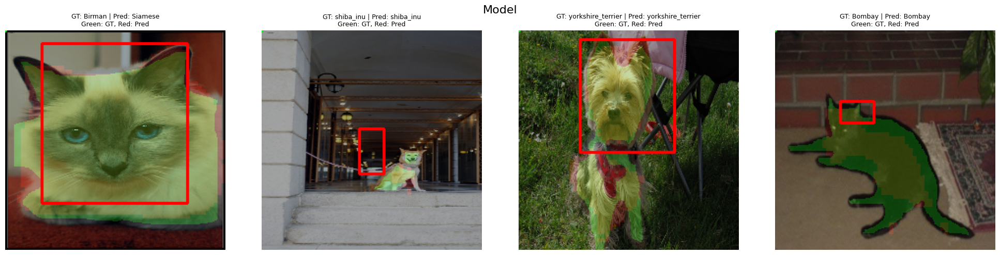

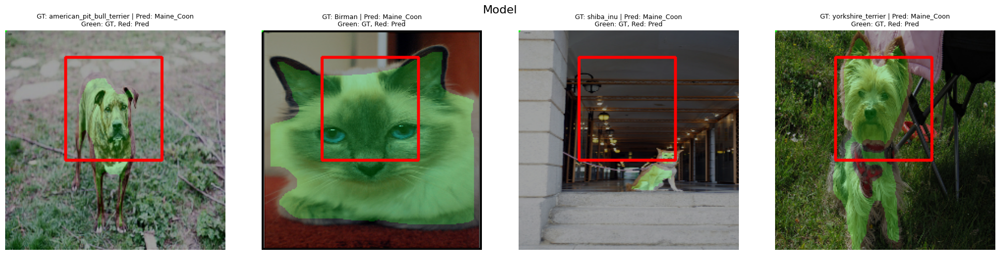

In [56]:
visualize_multi_task_outputs(multi_pt, test_dataset_final, info_dataset.features['label'].names)
visualize_multi_task_outputs(multi_scratch, test_dataset_final, info_dataset.features['label'].names)

# Comparison

In [73]:
def compareClassification(history1, history2):
    metrics = ['val_label_accuracy', 'val_label_loss']
    
    fig, axes = plt.subplots(1, 2, figsize=(20, 5))

    for i, metric in enumerate(metrics):
        ax = axes[i]

        y1 = history1.get(metric, [])
        y2 = history2.get(metric, [])

        x1 = range(len(y1))
        x2 = range(len(y2))

        ax.plot(x1, y1, label='Multi Task')
        ax.plot(x2, y2, label='Detection')

        ax.set_title(metric)
        ax.set_xlabel('Epochs')
        ax.set_ylabel(metric)
        ax.legend()

    plt.suptitle('Validation Classification Metrics', fontsize=16)
    plt.tight_layout()
    plt.show()

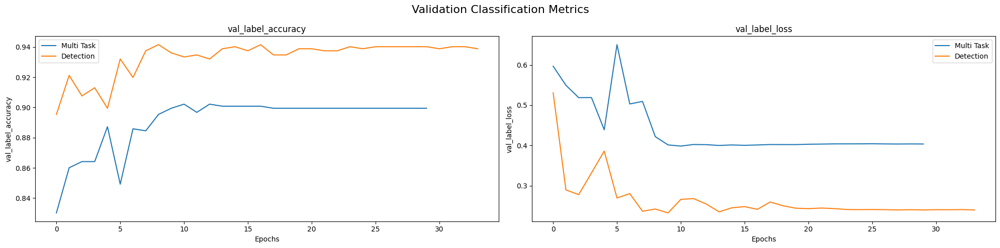

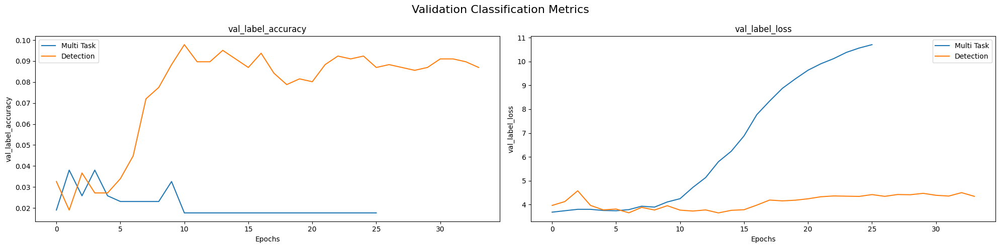

In [74]:
compareClassification(history_multi_pt, history_det_pt)
compareClassification(history_multi_scratch, history_det_scratch)

In [75]:
def compareDetection(history1, history2):
    metrics = ['val_bbox_mae', 'val_bbox_loss']
    
    fig, axes = plt.subplots(1, 2, figsize=(20, 5))

    for i, metric in enumerate(metrics):
        ax = axes[i]

        y1 = history1.get(metric, [])
        y2 = history2.get(metric, [])

        x1 = range(len(y1))
        x2 = range(len(y2))

        ax.plot(x1, y1, label='Multi Task')
        ax.plot(x2, y2, label='Detection')

        ax.set_title(metric)
        ax.set_xlabel('Epochs')
        ax.set_ylabel(metric)
        ax.legend()

    plt.suptitle('Validation Detection Metrics', fontsize=16)
    plt.tight_layout()
    plt.show()

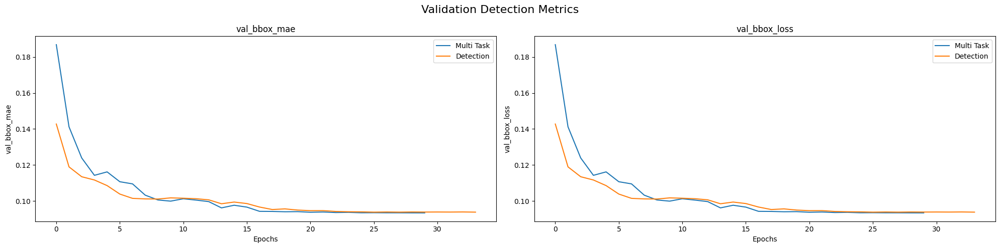

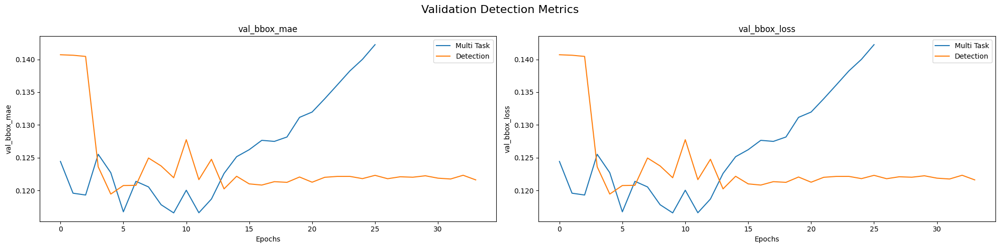

In [77]:
compareDetection(history_multi_pt, history_det_pt)
compareDetection(history_multi_scratch, history_det_scratch)

In [80]:
def compareSegmentation(history1, history2):
    metrics = ['val_mask_loss', 'val_mask_accuracy']
    metrics_ = ['val_loss', 'val_accuracy']
    
    fig, axes = plt.subplots(1, 2, figsize=(20, 5))

    for i, (metric, metric_) in enumerate(zip(metrics, metrics_)):
        ax = axes[i]

        y1 = history1.get(metric, [])
        y2 = history2.get(metric_, [])

        x1 = range(len(y1))
        x2 = range(len(y2))

        ax.plot(x1, y1, label='Multi Task')
        ax.plot(x2, y2, label='Segmentation')

        ax.set_title(metric)
        ax.set_xlabel('Epochs')
        ax.set_ylabel(metric_)
        ax.legend()

    plt.suptitle('Validation Segmentation Metrics', fontsize=16)
    plt.tight_layout()
    plt.show()

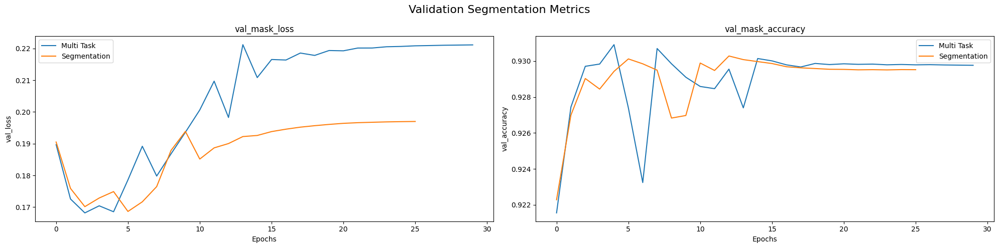

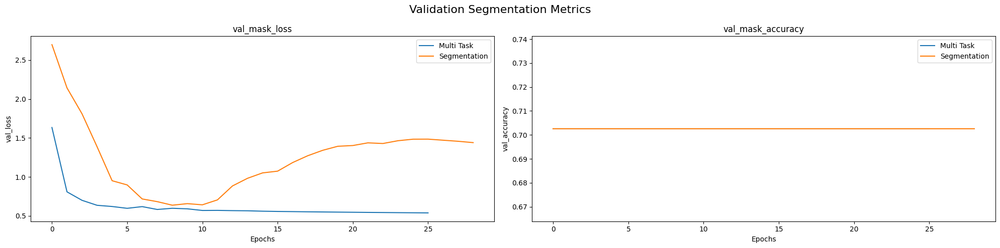

In [81]:
compareSegmentation(history_multi_pt, history_seg_pt)
compareSegmentation(history_multi_scratch, history_seg_scratch)